In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt
from IPython.display import clear_output

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 500
beta = torch.linspace(0.005, 0.025, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0005, device='cuda:0')

In [3]:
alpha_

tensor([9.9500e-01, 9.8999e-01, 9.8496e-01, 9.7991e-01, 9.7486e-01, 9.6979e-01,
        9.6470e-01, 9.5961e-01, 9.5450e-01, 9.4939e-01, 9.4426e-01, 9.3912e-01,
        9.3398e-01, 9.2882e-01, 9.2365e-01, 9.1848e-01, 9.1330e-01, 9.0811e-01,
        9.0291e-01, 8.9771e-01, 8.9250e-01, 8.8729e-01, 8.8207e-01, 8.7685e-01,
        8.7162e-01, 8.6639e-01, 8.6115e-01, 8.5592e-01, 8.5068e-01, 8.4543e-01,
        8.4019e-01, 8.3494e-01, 8.2970e-01, 8.2445e-01, 8.1921e-01, 8.1396e-01,
        8.0872e-01, 8.0348e-01, 7.9823e-01, 7.9300e-01, 7.8776e-01, 7.8253e-01,
        7.7730e-01, 7.7207e-01, 7.6685e-01, 7.6163e-01, 7.5642e-01, 7.5121e-01,
        7.4601e-01, 7.4081e-01, 7.3563e-01, 7.3044e-01, 7.2527e-01, 7.2010e-01,
        7.1494e-01, 7.0979e-01, 7.0465e-01, 6.9952e-01, 6.9439e-01, 6.8928e-01,
        6.8418e-01, 6.7908e-01, 6.7400e-01, 6.6893e-01, 6.6387e-01, 6.5882e-01,
        6.5378e-01, 6.4876e-01, 6.4374e-01, 6.3875e-01, 6.3376e-01, 6.2879e-01,
        6.2383e-01, 6.1888e-01, 6.1395e-

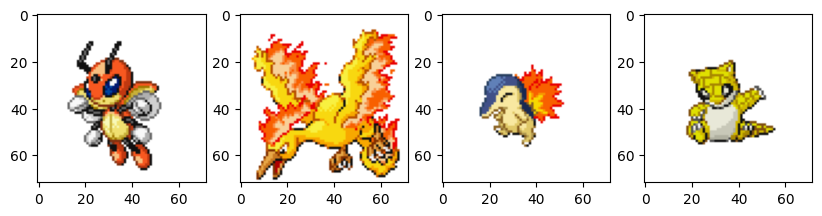

In [4]:
pos_transform = v2.Compose([
    v2.Pad(6, 1.0),
    v2.RandomCrop((64 + 6, 64 + 6)),
    v2.Pad(1, 1.0),
])
col_transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter()], 0.1),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.1),
    v2.RandomGrayscale(p = 0.1),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([pos_transform(col_transform(x)) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)

In [6]:
model = UNet_conditional(3, 3, time_dim=512, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3
    
    #A = torch.tensor([300, 300, 300], device=device)
    #x0 = pimages[1, [0,151,251]]
    #x0 = torch.stack([transform(x) for x in x0], dim=0)
    #x0 = isigmoid(x0)
    #z = torch.randn_like(x0)
    #x = torch.sqrt(alpha_[A])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[A])[:, None, None, None] * z

    x = torch.randn((N, 3, 72, 72), device=device)
    
    ty = [["Dark"], ["Fairy"], ["Electric"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    c = contour[1, [0, 151, 251]]
    c = torch.stack([pos_transform(d) for d in c], dim=0)
    c = isigmoid(c)

    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty, c) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])

        #clear_output(wait=True)
        #fig, axes = plt.subplots(1, N, figsize=(10, 10))
        #for i in range(N):
        #    plot_image(torch.sigmoid(x-e)[i], axes[i])
        #plt.show()

    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|                                                                                                                                                | 0/250001 [00:00<?, ?it/s]

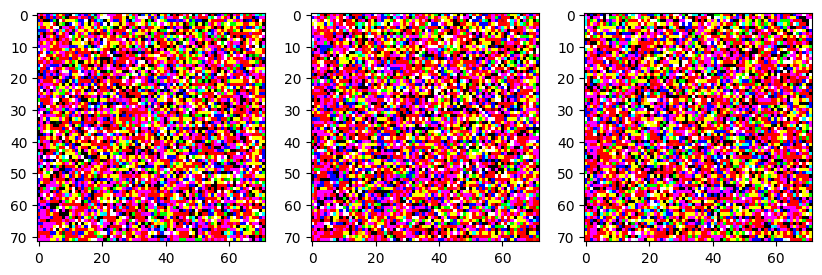

0.07819279:   1%|▉                                                                                                                      | 1999/250001 [01:53<3:46:04, 18.28it/s]

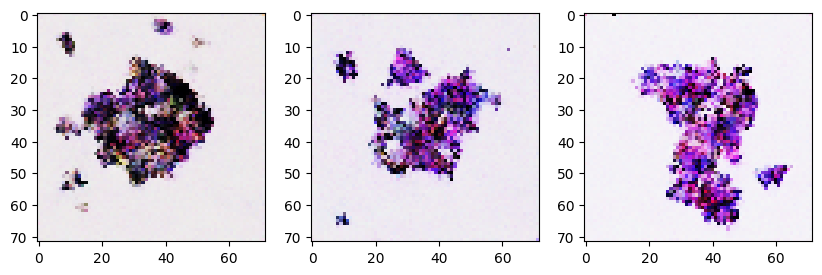

0.06258113:   2%|█▉                                                                                                                     | 3999/250001 [03:47<3:44:12, 18.29it/s]

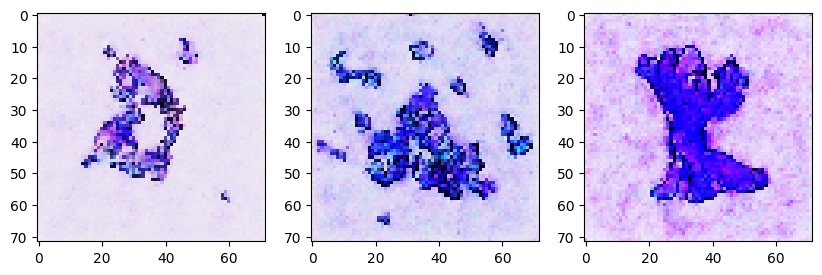

0.05644388:   2%|██▊                                                                                                                    | 5999/250001 [05:41<3:42:28, 18.28it/s]

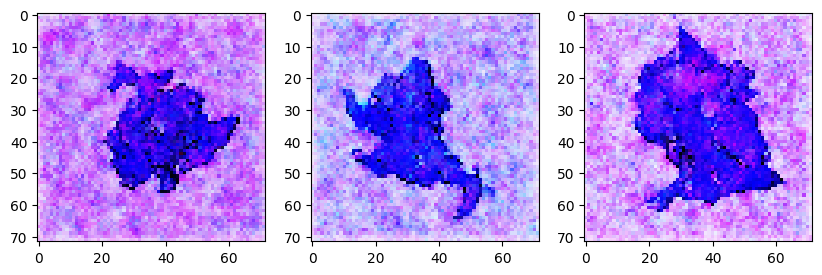

0.02198592:   3%|███▊                                                                                                                   | 7999/250001 [07:35<3:40:33, 18.29it/s]

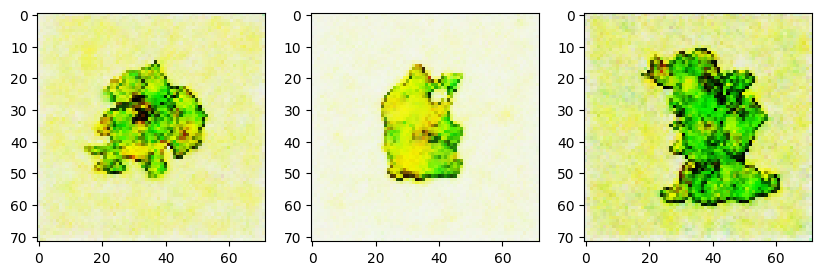

0.04000425:   4%|████▊                                                                                                                  | 9999/250001 [09:29<3:38:31, 18.30it/s]

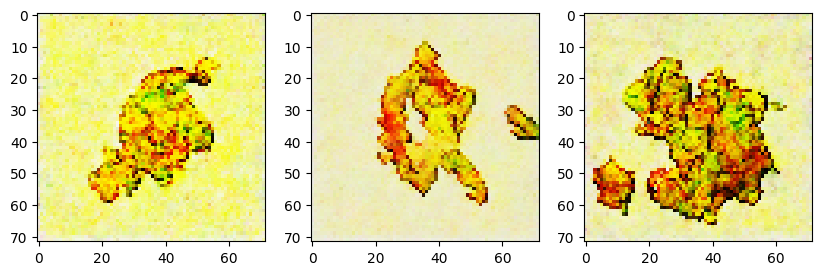

0.06746844:   5%|█████▋                                                                                                                | 11999/250001 [11:22<3:36:29, 18.32it/s]

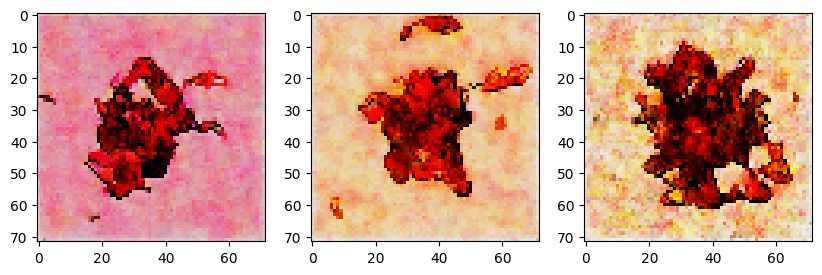

0.01543359:   6%|██████▌                                                                                                               | 13999/250001 [13:16<3:35:08, 18.28it/s]

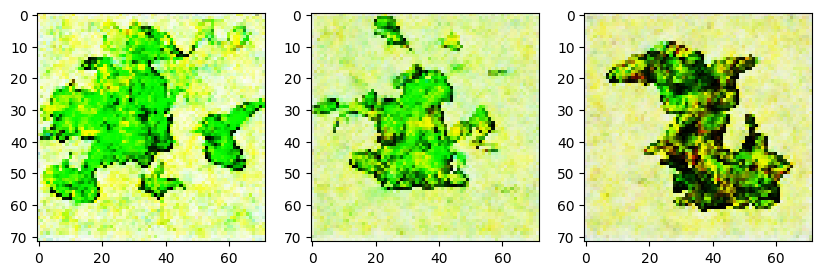

0.04058989:   6%|███████▌                                                                                                              | 15999/250001 [15:10<3:32:59, 18.31it/s]

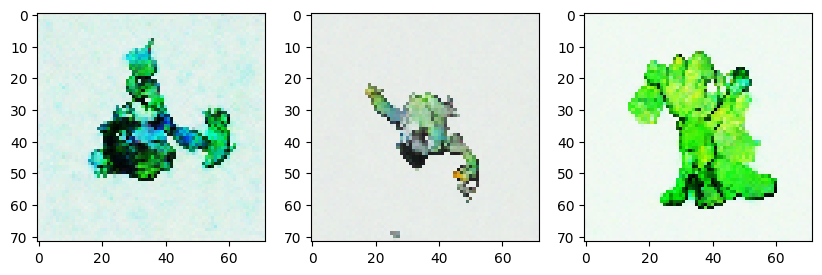

0.02431077:   7%|████████▍                                                                                                             | 17999/250001 [17:03<3:31:16, 18.30it/s]

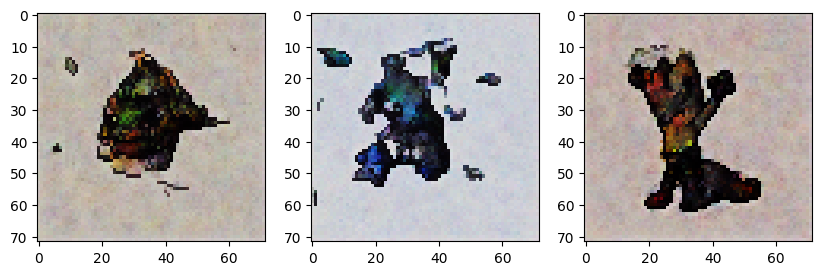

0.00714826:   8%|█████████▍                                                                                                            | 19999/250001 [18:57<3:29:29, 18.30it/s]

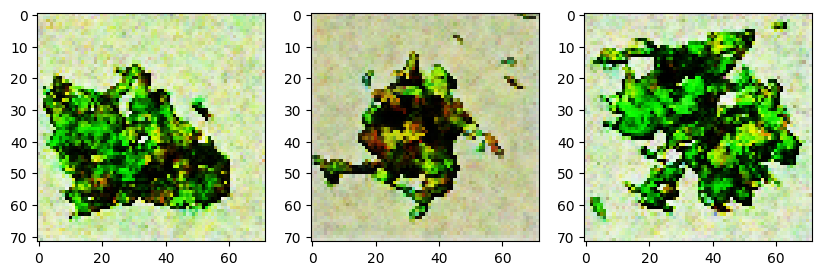

0.01160633:   9%|██████████▍                                                                                                           | 21999/250001 [20:51<3:27:39, 18.30it/s]

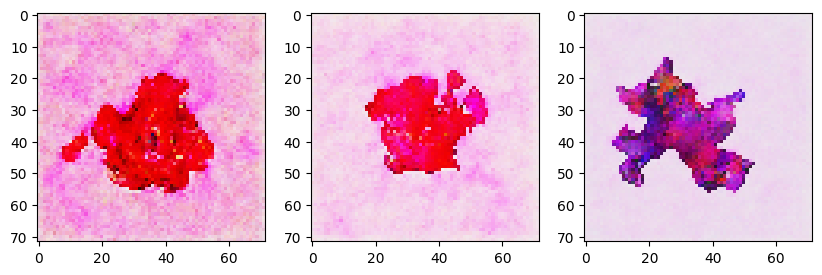

0.03444702:  10%|███████████▎                                                                                                          | 23999/250001 [22:44<3:25:38, 18.32it/s]

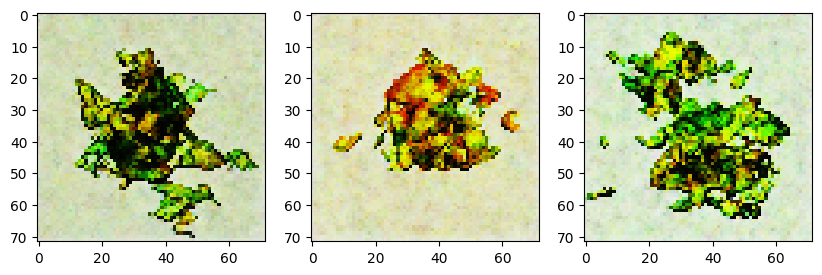

0.01661423:  10%|████████████▎                                                                                                         | 25999/250001 [24:38<3:24:02, 18.30it/s]

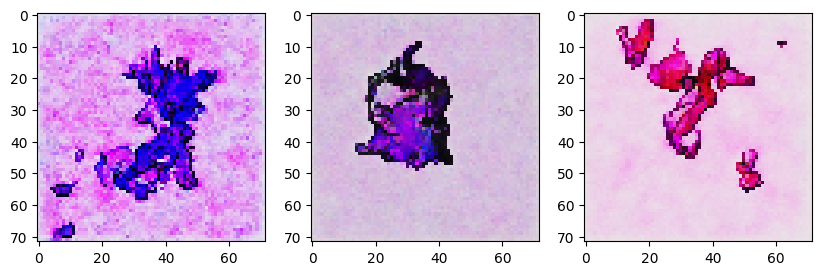

0.02231002:  11%|█████████████▏                                                                                                        | 27999/250001 [26:32<3:22:09, 18.30it/s]

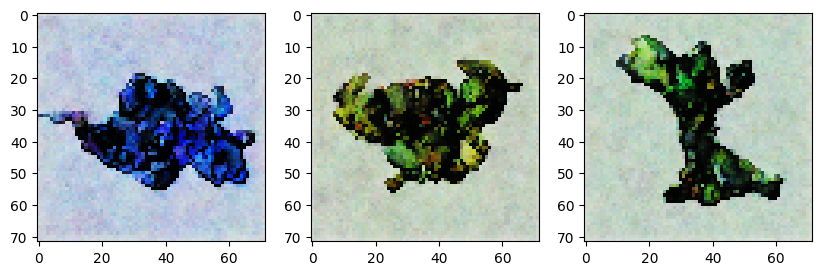

0.03861982:  12%|██████████████▏                                                                                                       | 29999/250001 [28:26<3:20:13, 18.31it/s]

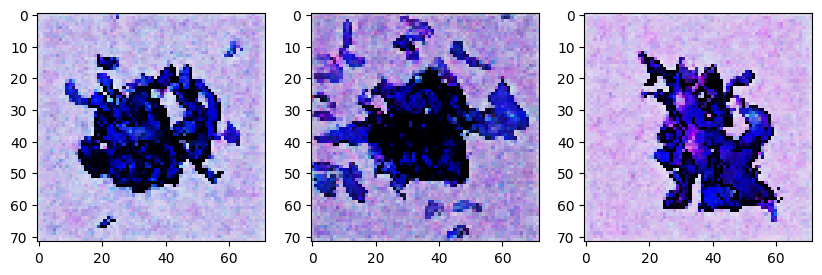

0.01870240:  13%|███████████████                                                                                                       | 31999/250001 [30:19<3:18:13, 18.33it/s]

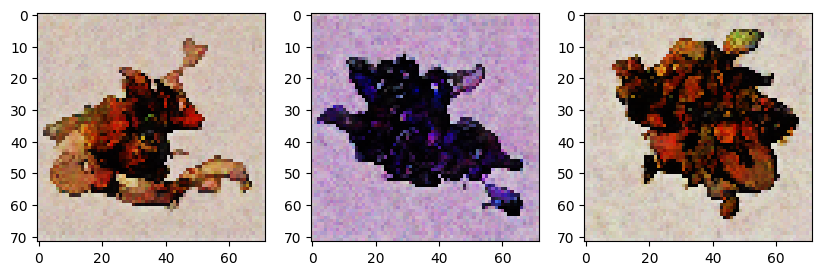

0.03443659:  14%|████████████████                                                                                                      | 33999/250001 [32:13<3:16:34, 18.31it/s]

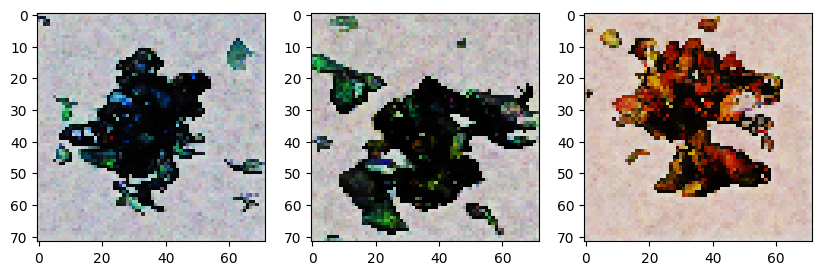

0.01443295:  14%|████████████████▉                                                                                                     | 35999/250001 [34:07<3:14:45, 18.31it/s]

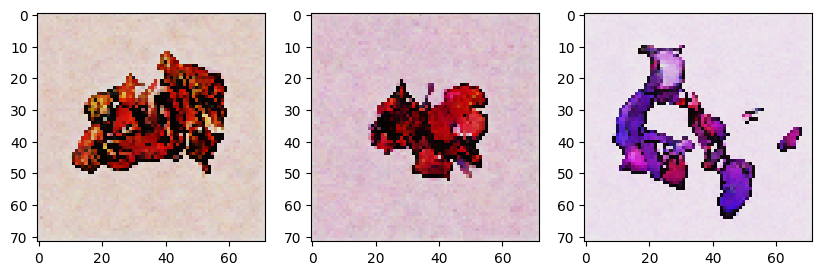

0.02143706:  15%|█████████████████▉                                                                                                    | 37999/250001 [36:01<3:13:10, 18.29it/s]

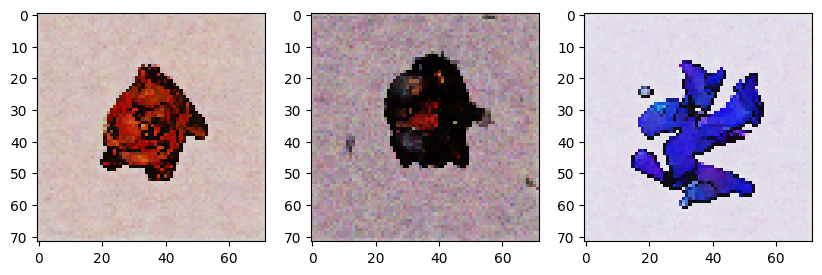

0.02569783:  16%|██████████████████▉                                                                                                   | 39999/250001 [37:54<3:11:14, 18.30it/s]

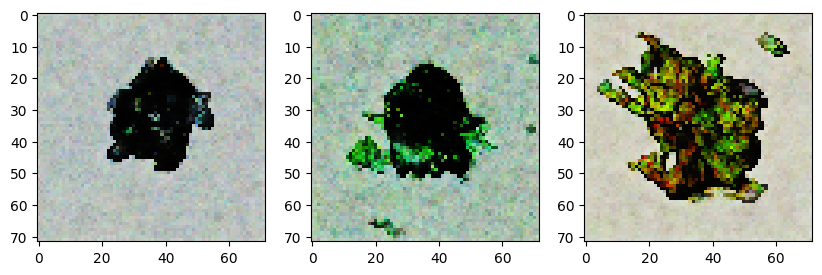

0.06549069:  17%|███████████████████▊                                                                                                  | 41999/250001 [39:48<3:09:32, 18.29it/s]

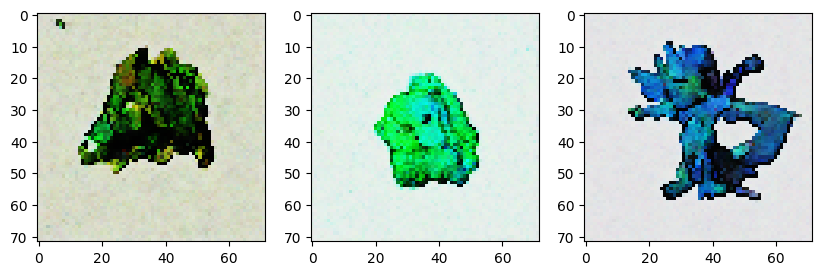

0.00983640:  18%|████████████████████▊                                                                                                 | 43999/250001 [41:42<3:08:10, 18.24it/s]

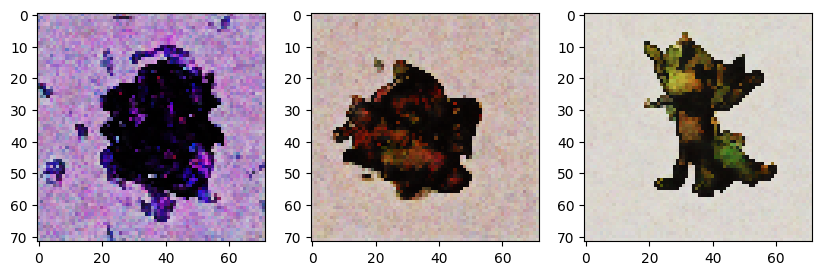

0.01519775:  18%|█████████████████████▋                                                                                                | 45999/250001 [43:36<3:05:56, 18.29it/s]

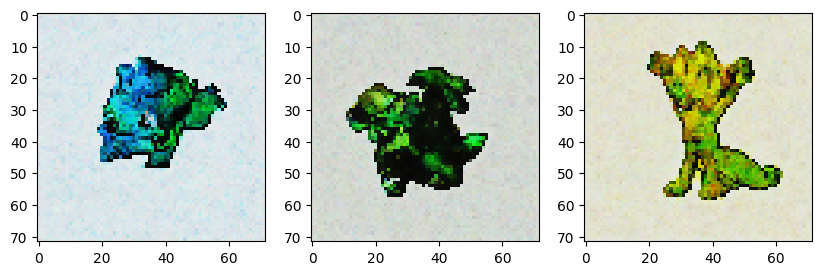

0.03010688:  19%|██████████████████████▋                                                                                               | 47999/250001 [45:29<3:03:31, 18.35it/s]

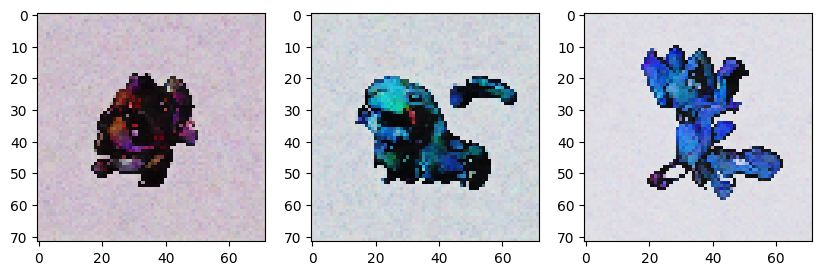

0.02968753:  20%|███████████████████████▌                                                                                              | 49999/250001 [47:23<3:01:50, 18.33it/s]

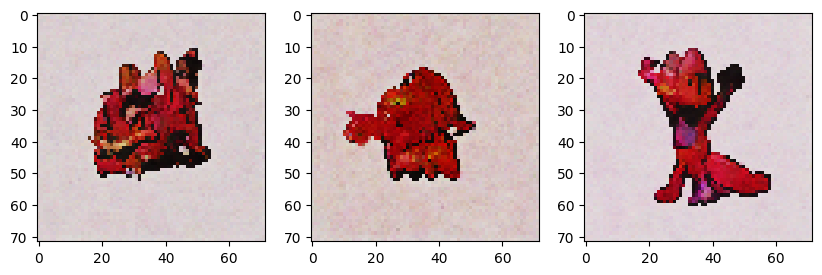

0.02647496:  21%|████████████████████████▌                                                                                             | 51999/250001 [49:17<3:00:24, 18.29it/s]

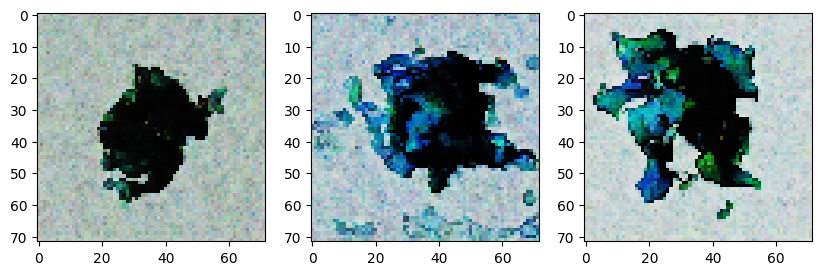

0.01977535:  22%|█████████████████████████▍                                                                                            | 53999/250001 [51:11<2:58:21, 18.31it/s]

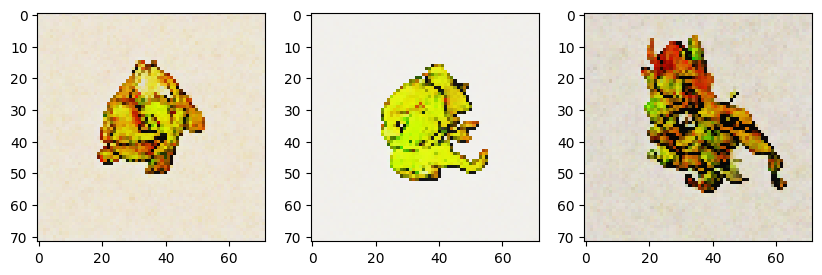

0.01371271:  22%|██████████████████████████▍                                                                                           | 55999/250001 [53:04<2:56:45, 18.29it/s]

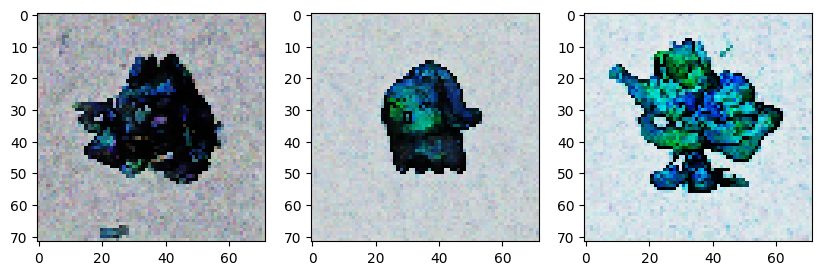

0.02001609:  23%|███████████████████████████▍                                                                                          | 57999/250001 [54:58<2:54:53, 18.30it/s]

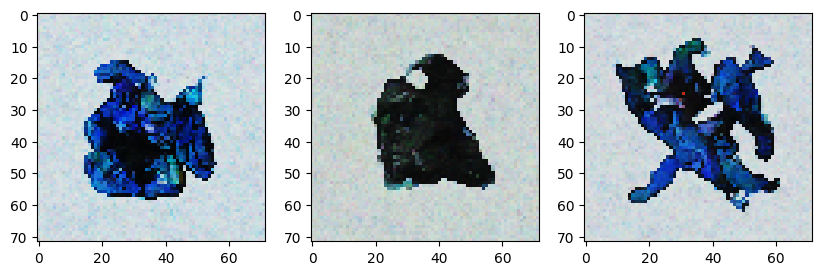

0.01544702:  24%|████████████████████████████▎                                                                                         | 59999/250001 [56:52<2:53:04, 18.30it/s]

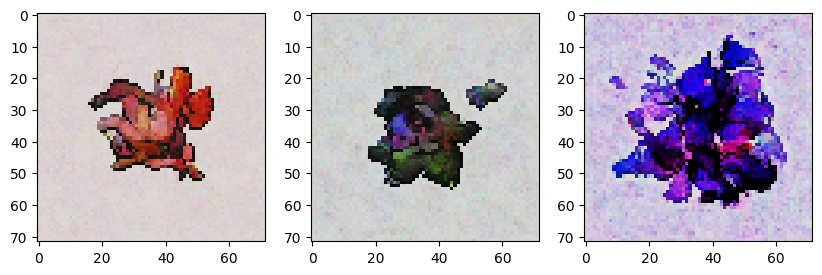

0.03420623:  25%|█████████████████████████████▎                                                                                        | 61999/250001 [58:46<2:51:19, 18.29it/s]

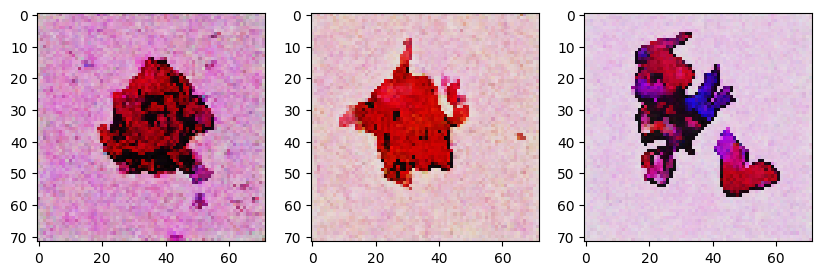

0.03201000:  26%|█████████████████████████████▋                                                                                      | 63999/250001 [1:00:39<2:49:25, 18.30it/s]

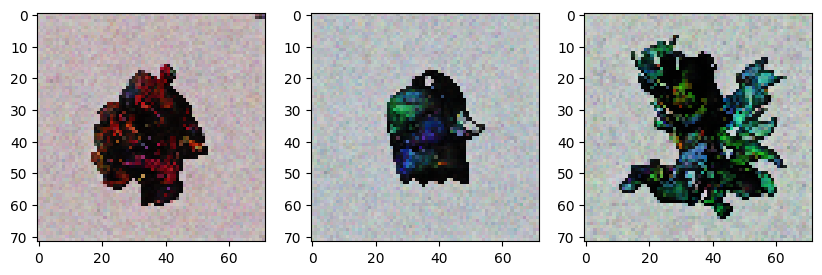

0.00894490:  26%|██████████████████████████████▌                                                                                     | 65999/250001 [1:02:33<2:47:32, 18.30it/s]

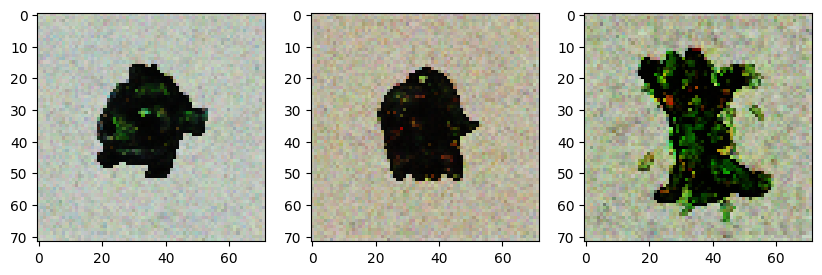

0.03104149:  27%|███████████████████████████████▌                                                                                    | 67999/250001 [1:04:27<2:45:48, 18.29it/s]

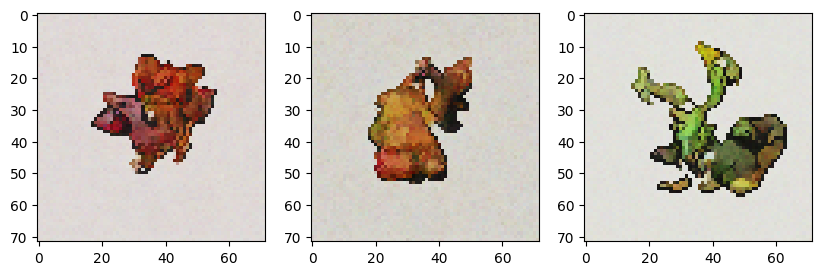

0.02610319:  28%|████████████████████████████████▍                                                                                   | 69999/250001 [1:06:21<2:43:57, 18.30it/s]

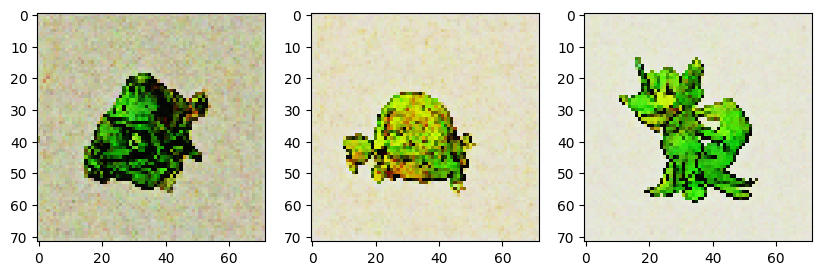

0.01543069:  29%|█████████████████████████████████▍                                                                                  | 71999/250001 [1:08:14<2:42:10, 18.29it/s]

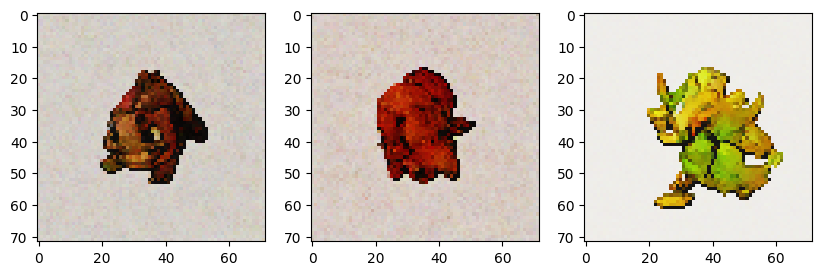

0.01461951:  30%|██████████████████████████████████▎                                                                                 | 73999/250001 [1:10:08<2:40:23, 18.29it/s]

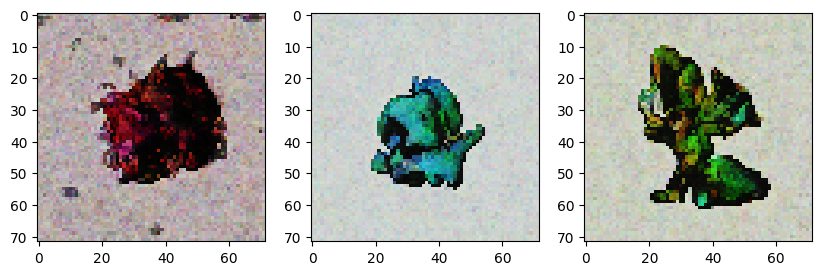

0.02259902:  30%|███████████████████████████████████▎                                                                                | 75999/250001 [1:12:02<2:38:28, 18.30it/s]

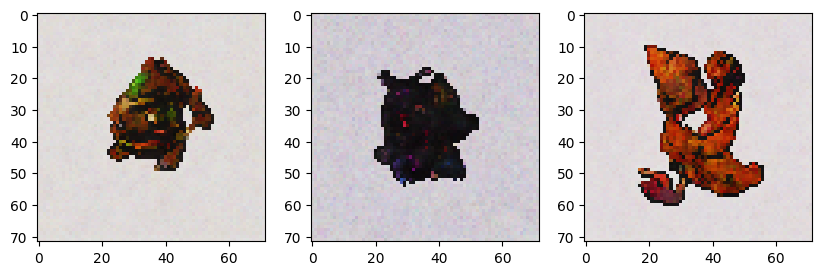

0.01819019:  31%|████████████████████████████████████▏                                                                               | 77999/250001 [1:13:56<2:36:39, 18.30it/s]

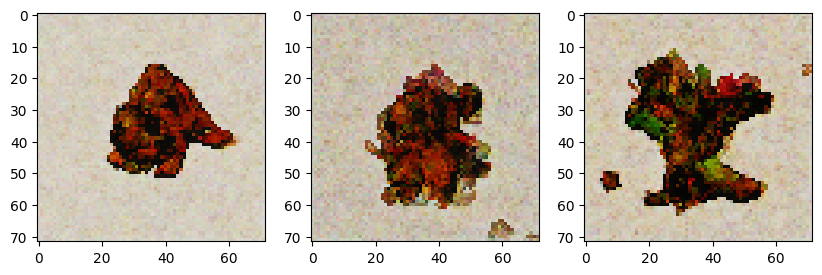

0.01390461:  32%|█████████████████████████████████████                                                                               | 79999/250001 [1:15:49<2:34:48, 18.30it/s]

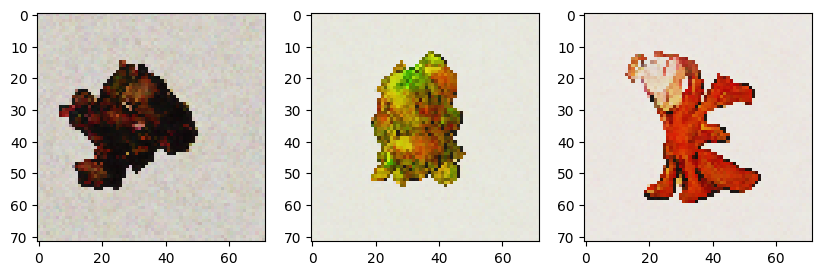

0.02776176:  33%|██████████████████████████████████████                                                                              | 81999/250001 [1:17:43<2:33:05, 18.29it/s]

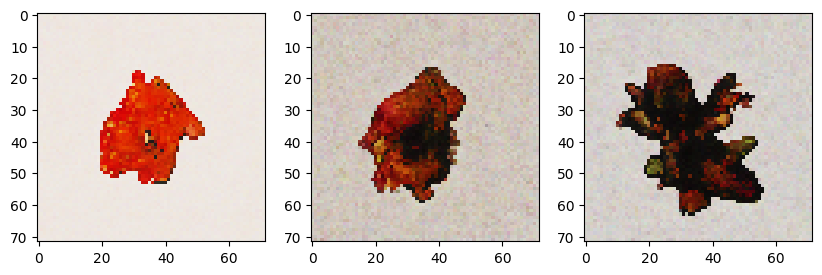

0.01737412:  34%|██████████████████████████████████████▉                                                                             | 83999/250001 [1:19:37<2:31:10, 18.30it/s]

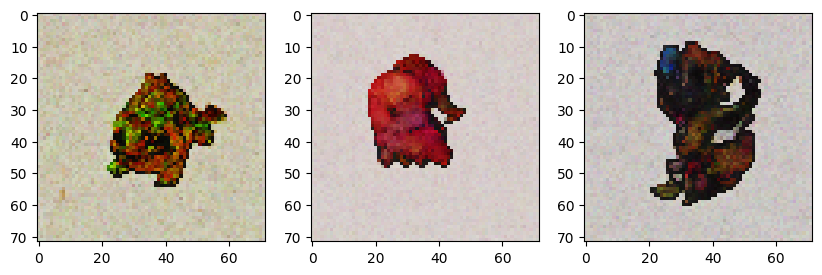

0.03064571:  34%|███████████████████████████████████████▉                                                                            | 85999/250001 [1:21:31<2:29:20, 18.30it/s]

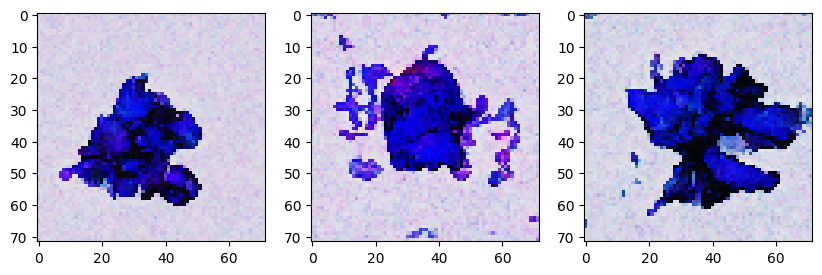

0.01429468:  35%|████████████████████████████████████████▊                                                                           | 87999/250001 [1:23:24<2:27:32, 18.30it/s]

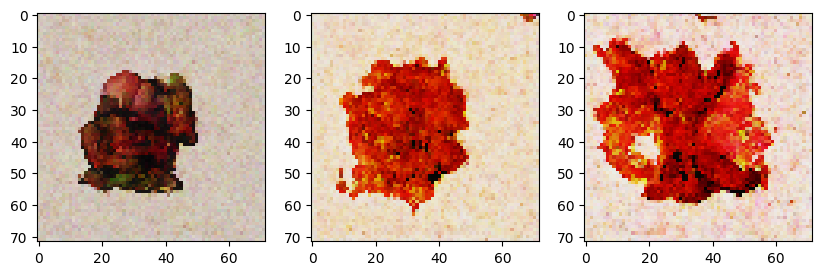

0.01111462:  36%|█████████████████████████████████████████▊                                                                          | 89999/250001 [1:25:18<2:25:41, 18.30it/s]

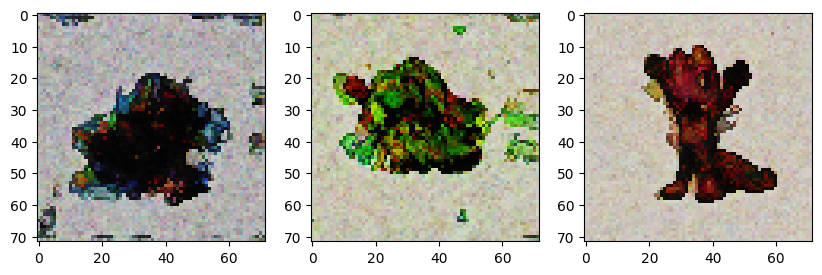

0.02804927:  37%|██████████████████████████████████████████▋                                                                         | 91999/250001 [1:27:12<2:23:55, 18.30it/s]

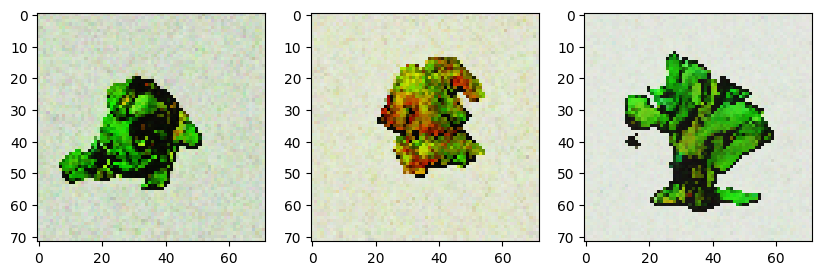

0.01386118:  38%|███████████████████████████████████████████▌                                                                        | 93999/250001 [1:29:06<2:22:00, 18.31it/s]

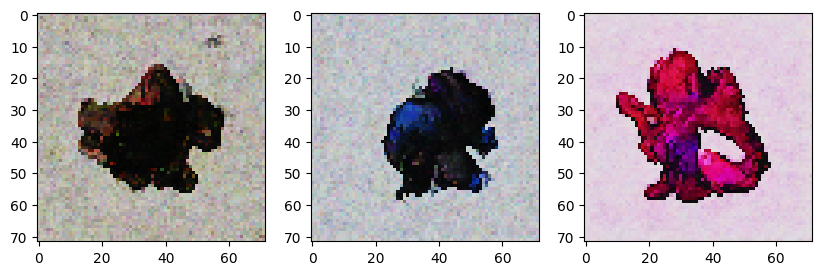

0.01695957:  38%|████████████████████████████████████████████▌                                                                       | 95999/250001 [1:30:59<2:20:14, 18.30it/s]

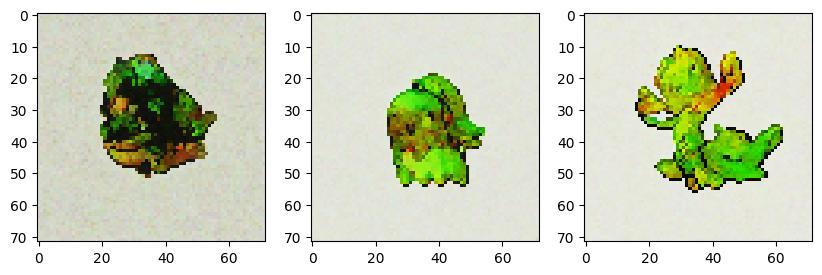

0.03416681:  39%|█████████████████████████████████████████████▍                                                                      | 97999/250001 [1:32:53<2:18:34, 18.28it/s]

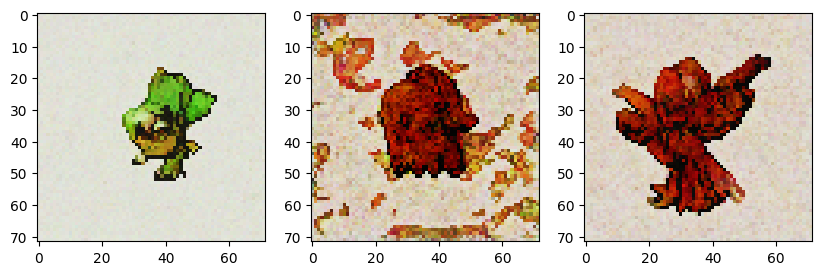

0.02108825:  40%|██████████████████████████████████████████████▍                                                                     | 99999/250001 [1:34:47<2:16:29, 18.32it/s]

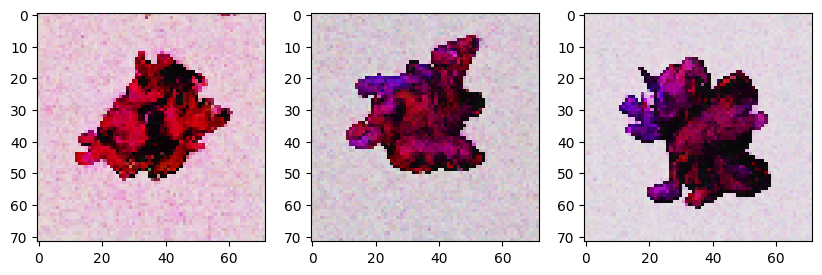

0.00789177:  41%|██████████████████████████████████████████████▉                                                                    | 101999/250001 [1:36:41<2:14:50, 18.29it/s]

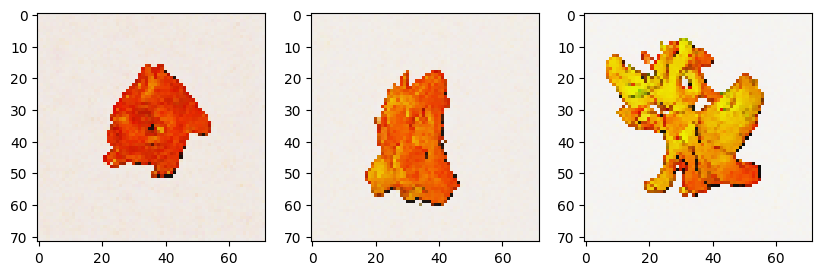

0.02058146:  42%|███████████████████████████████████████████████▊                                                                   | 103999/250001 [1:38:34<2:13:05, 18.28it/s]

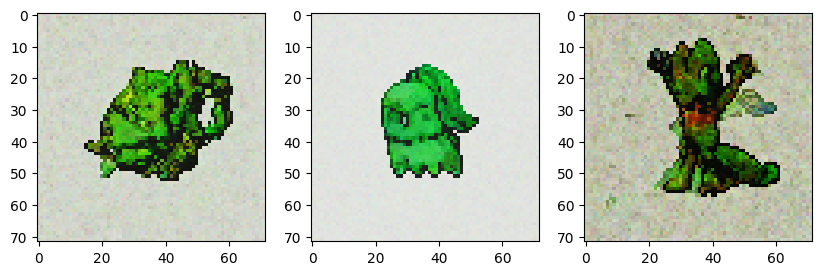

0.03298062:  42%|████████████████████████████████████████████████▊                                                                  | 105999/250001 [1:40:28<2:11:08, 18.30it/s]

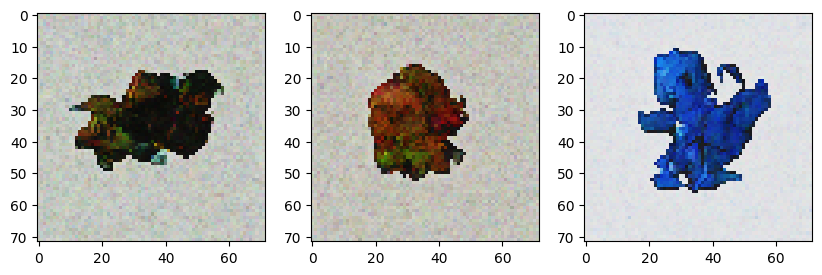

0.01387206:  43%|█████████████████████████████████████████████████▋                                                                 | 107999/250001 [1:42:22<2:09:13, 18.31it/s]

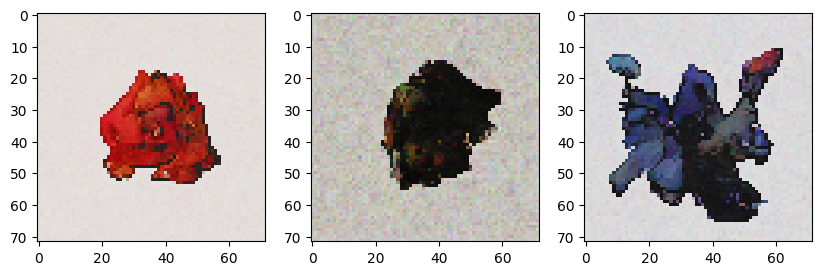

0.01767713:  44%|██████████████████████████████████████████████████▌                                                                | 109999/250001 [1:44:16<2:07:29, 18.30it/s]

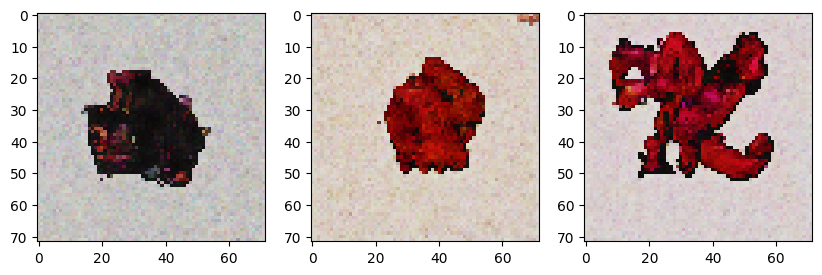

0.01959872:  45%|███████████████████████████████████████████████████▌                                                               | 111999/250001 [1:46:09<2:05:42, 18.30it/s]

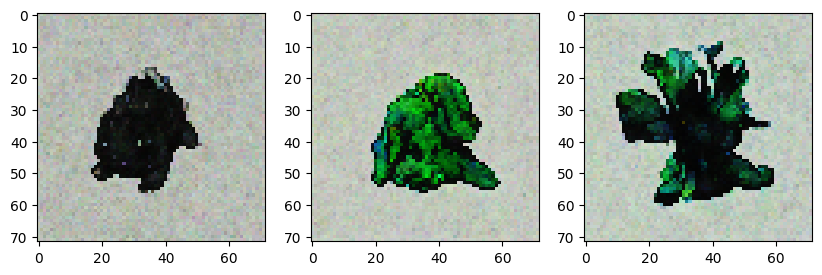

0.01668589:  46%|████████████████████████████████████████████████████▍                                                              | 113999/250001 [1:48:03<2:03:59, 18.28it/s]

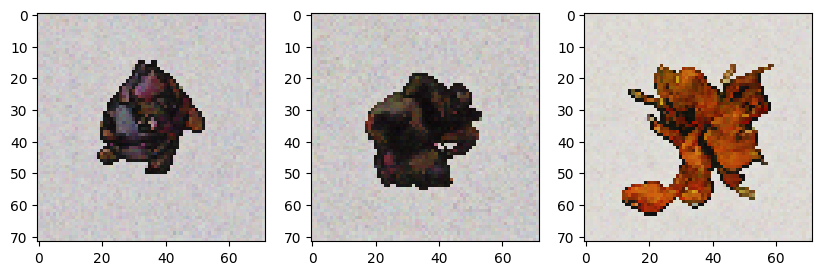

0.01184248:  46%|█████████████████████████████████████████████████████▎                                                             | 115999/250001 [1:49:57<2:02:06, 18.29it/s]

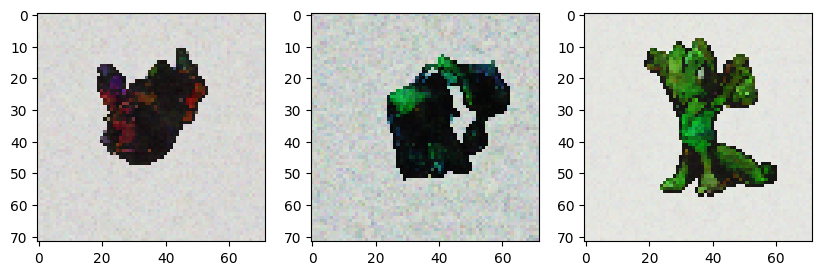

0.02494710:  47%|██████████████████████████████████████████████████████▎                                                            | 117999/250001 [1:51:51<2:00:15, 18.29it/s]

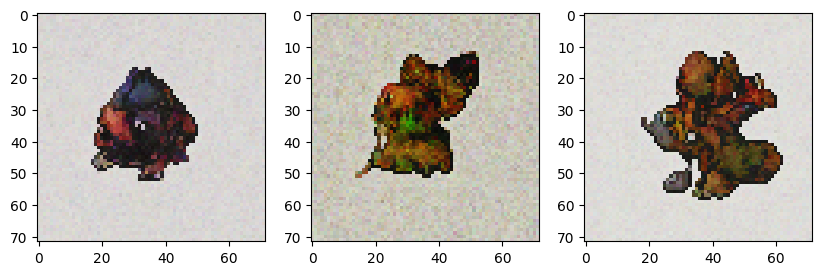

0.02884004:  48%|███████████████████████████████████████████████████████▏                                                           | 119999/250001 [1:53:44<1:58:57, 18.21it/s]

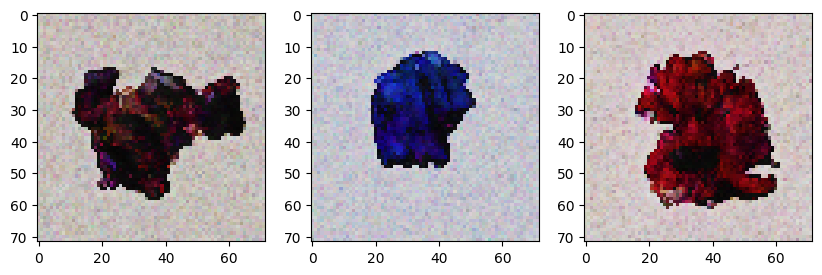

0.02890792:  49%|████████████████████████████████████████████████████████                                                           | 121999/250001 [1:55:38<1:56:32, 18.30it/s]

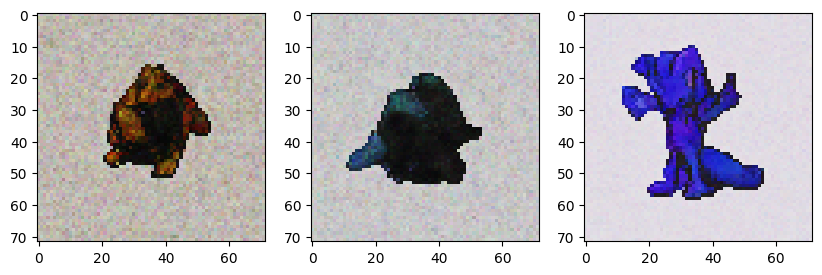

0.01412475:  50%|█████████████████████████████████████████████████████████                                                          | 123999/250001 [1:57:32<1:54:40, 18.31it/s]

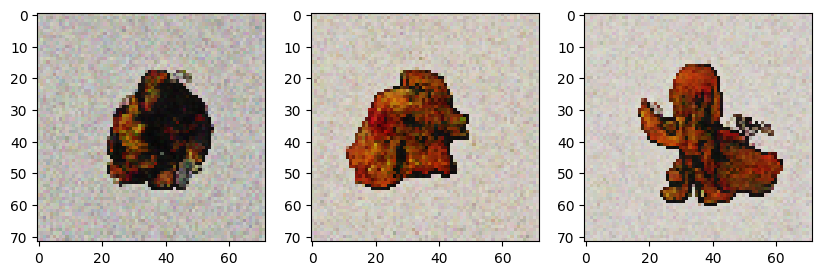

0.02351323:  50%|█████████████████████████████████████████████████████████▉                                                         | 125999/250001 [1:59:25<1:53:10, 18.26it/s]

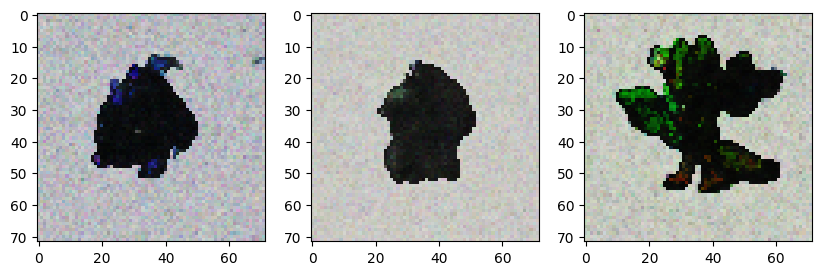

0.02356784:  51%|██████████████████████████████████████████████████████████▉                                                        | 127999/250001 [2:01:19<1:51:05, 18.30it/s]

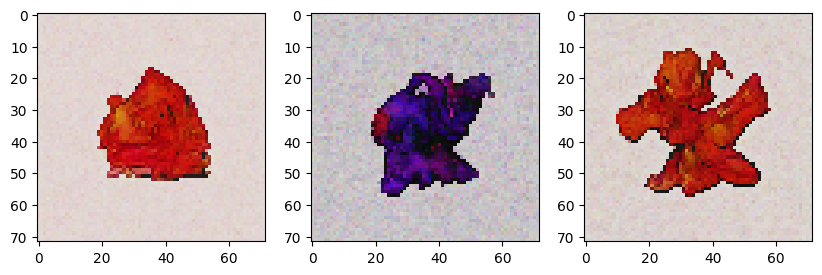

0.01755046:  52%|███████████████████████████████████████████████████████████▊                                                       | 129999/250001 [2:03:13<1:49:27, 18.27it/s]

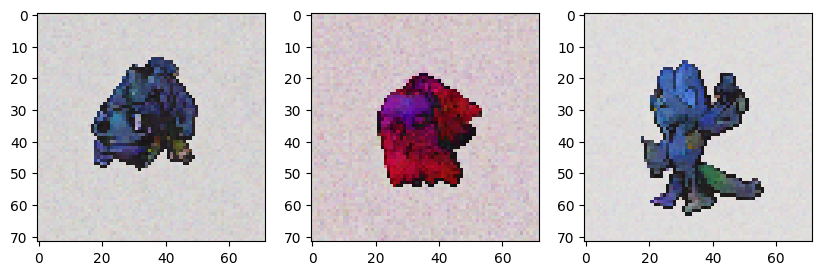

0.02101570:  53%|████████████████████████████████████████████████████████████▋                                                      | 131999/250001 [2:05:07<1:47:26, 18.30it/s]

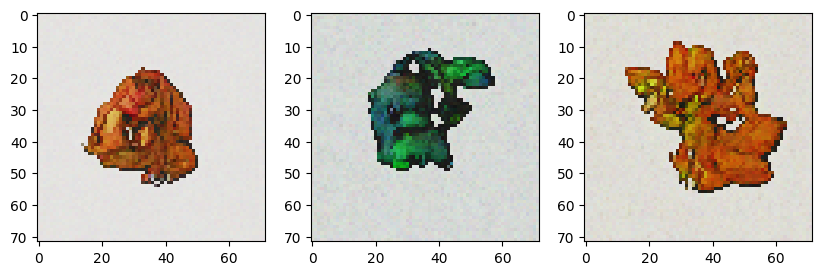

0.02845285:  54%|█████████████████████████████████████████████████████████████▋                                                     | 133999/250001 [2:07:00<1:45:41, 18.29it/s]

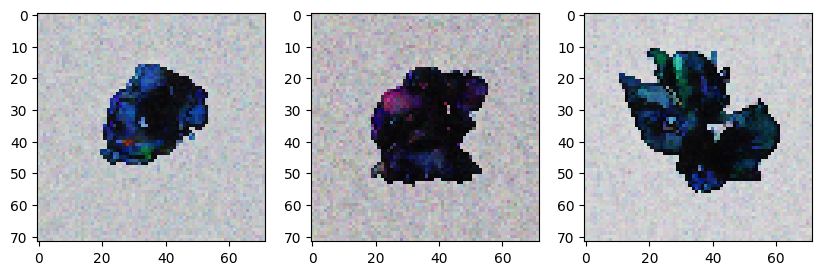

0.01992913:  54%|██████████████████████████████████████████████████████████████▌                                                    | 135999/250001 [2:08:54<1:43:54, 18.29it/s]

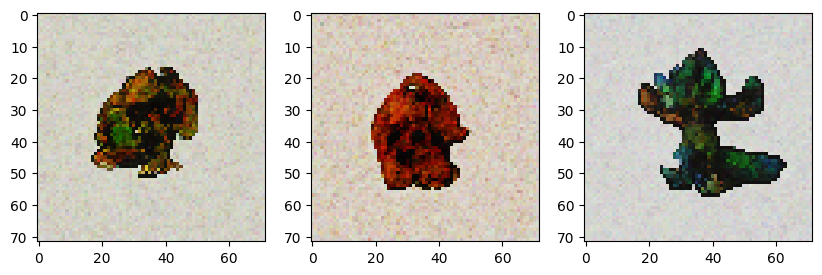

0.01809915:  55%|███████████████████████████████████████████████████████████████▍                                                   | 137999/250001 [2:10:48<1:42:04, 18.29it/s]

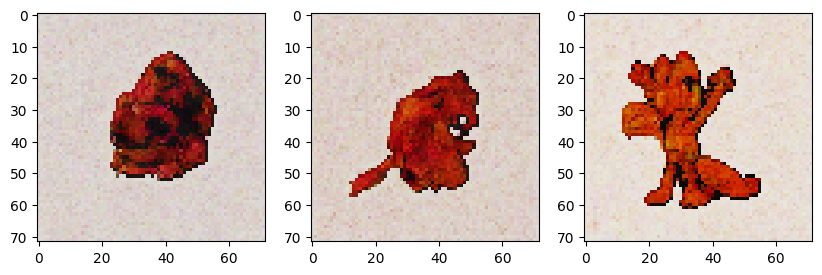

0.02523758:  56%|████████████████████████████████████████████████████████████████▍                                                  | 139999/250001 [2:12:42<1:40:20, 18.27it/s]

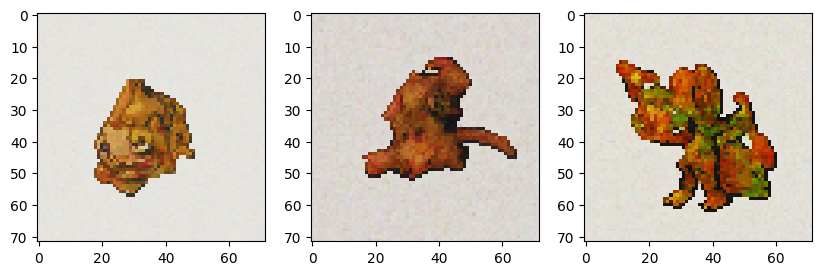

0.02975074:  57%|█████████████████████████████████████████████████████████████████▎                                                 | 141999/250001 [2:14:35<1:38:20, 18.30it/s]

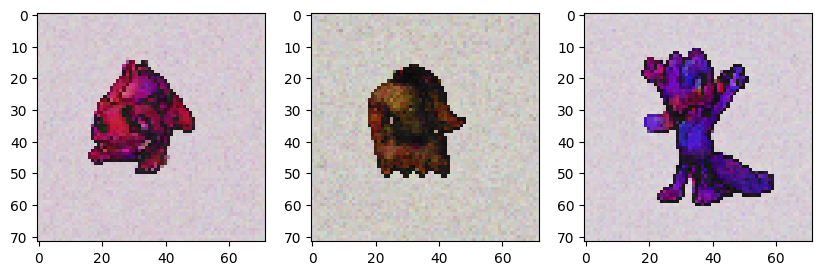

0.01737390:  58%|██████████████████████████████████████████████████████████████████▏                                                | 143999/250001 [2:16:29<1:36:30, 18.31it/s]

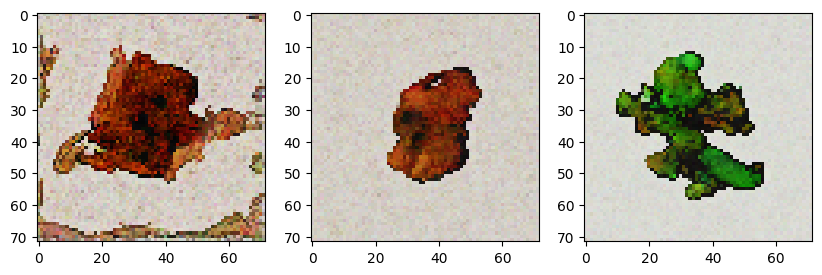

0.02263921:  58%|███████████████████████████████████████████████████████████████████▏                                               | 145999/250001 [2:18:23<1:34:42, 18.30it/s]

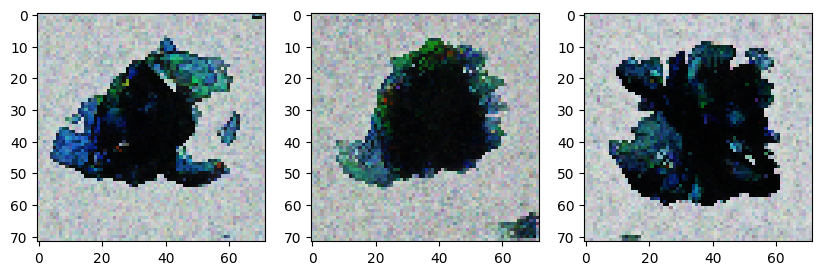

0.01584786:  59%|████████████████████████████████████████████████████████████████████                                               | 147999/250001 [2:20:17<1:32:53, 18.30it/s]

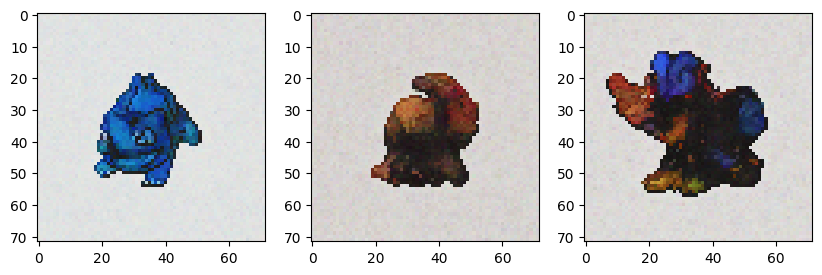

0.01350291:  60%|████████████████████████████████████████████████████████████████████▉                                              | 149999/250001 [2:22:10<1:31:32, 18.21it/s]

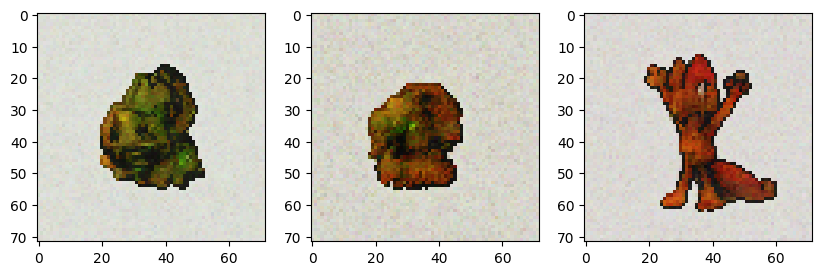

0.02048111:  61%|█████████████████████████████████████████████████████████████████████▉                                             | 151999/250001 [2:24:04<1:29:15, 18.30it/s]

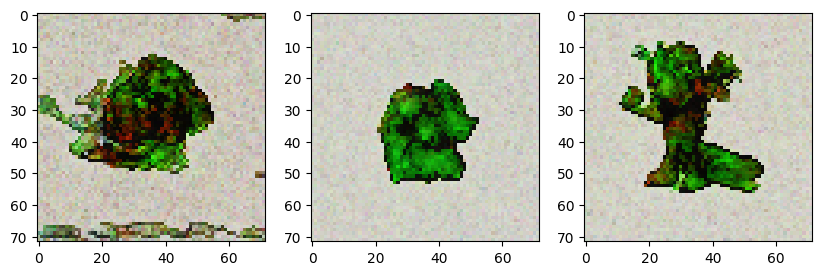

0.00973689:  62%|██████████████████████████████████████████████████████████████████████▊                                            | 153999/250001 [2:25:58<1:27:32, 18.28it/s]

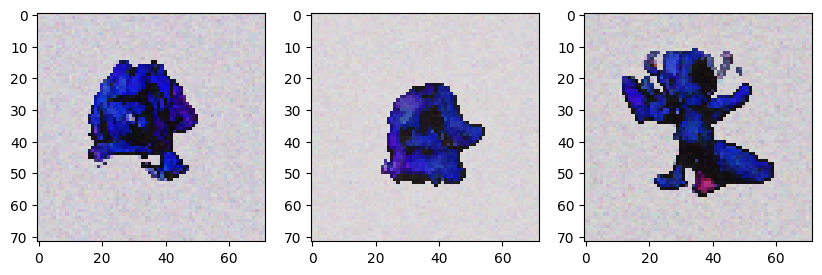

0.03968379:  62%|███████████████████████████████████████████████████████████████████████▊                                           | 155999/250001 [2:27:52<1:25:37, 18.30it/s]

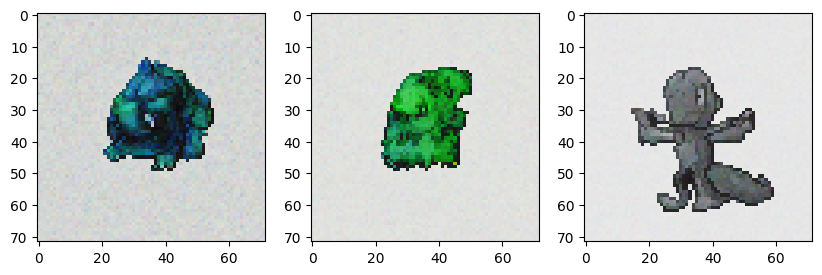

0.01516391:  63%|████████████████████████████████████████████████████████████████████████▋                                          | 157999/250001 [2:29:45<1:23:45, 18.31it/s]

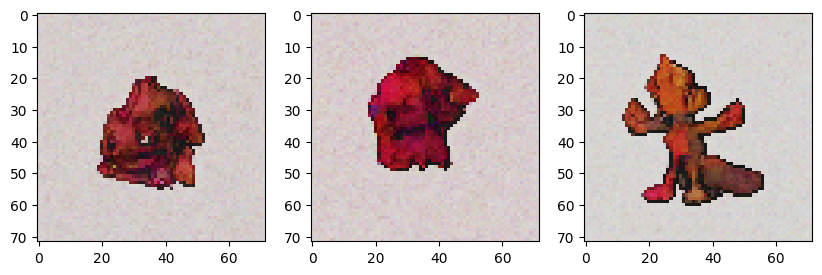

0.01523695:  64%|█████████████████████████████████████████████████████████████████████████▌                                         | 159999/250001 [2:31:39<1:21:48, 18.34it/s]

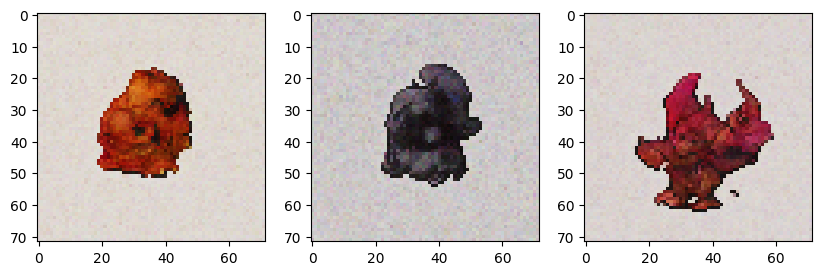

0.01851647:  65%|██████████████████████████████████████████████████████████████████████████▌                                        | 161999/250001 [2:33:33<1:20:08, 18.30it/s]

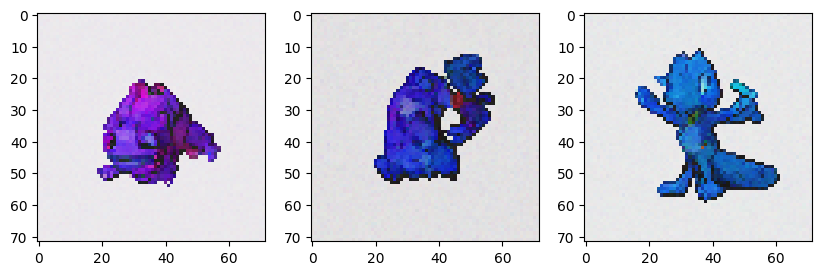

0.01865265:  66%|███████████████████████████████████████████████████████████████████████████▍                                       | 163999/250001 [2:35:27<1:18:22, 18.29it/s]

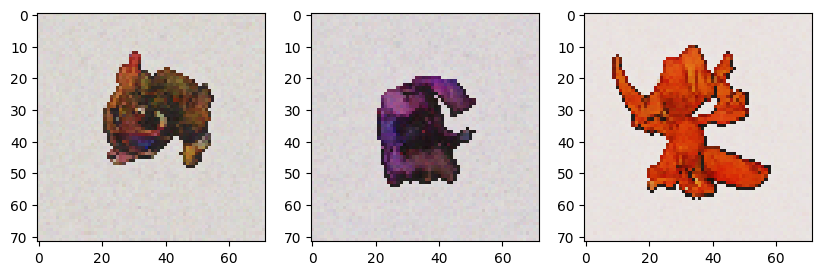

0.01511503:  66%|████████████████████████████████████████████████████████████████████████████▎                                      | 165999/250001 [2:37:20<1:16:34, 18.28it/s]

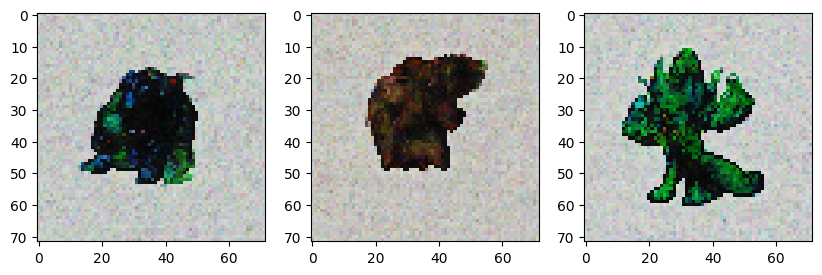

0.02568626:  67%|█████████████████████████████████████████████████████████████████████████████▎                                     | 167999/250001 [2:39:14<1:14:51, 18.26it/s]

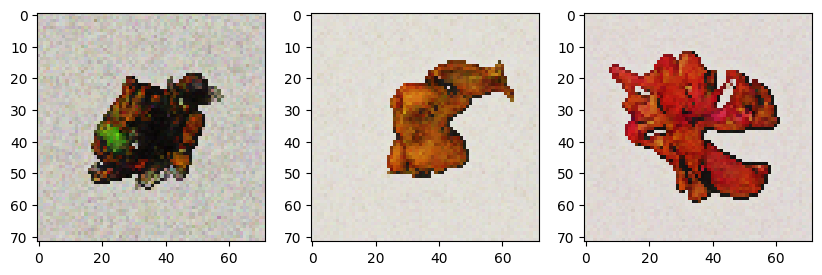

0.00769922:  68%|██████████████████████████████████████████████████████████████████████████████▏                                    | 169999/250001 [2:41:08<1:12:55, 18.29it/s]

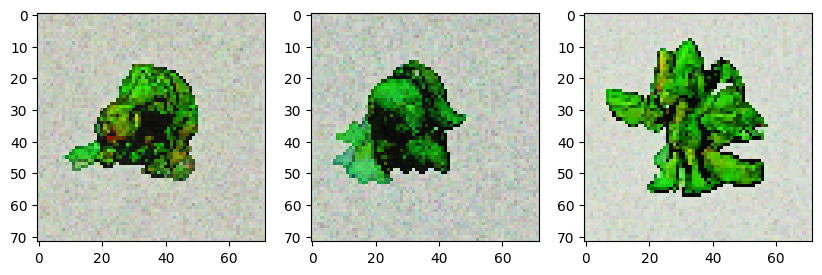

0.02510733:  69%|███████████████████████████████████████████████████████████████████████████████                                    | 171999/250001 [2:43:02<1:11:02, 18.30it/s]

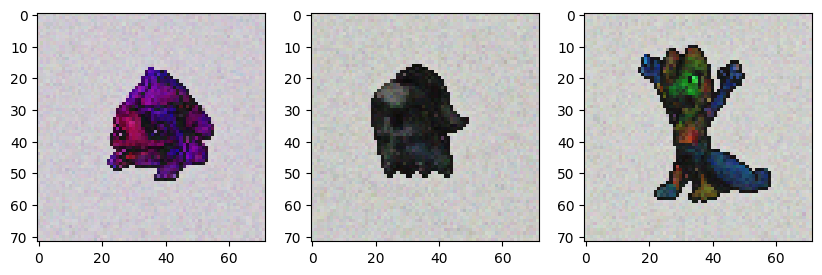

0.01596183:  70%|████████████████████████████████████████████████████████████████████████████████                                   | 173999/250001 [2:44:56<1:09:07, 18.32it/s]

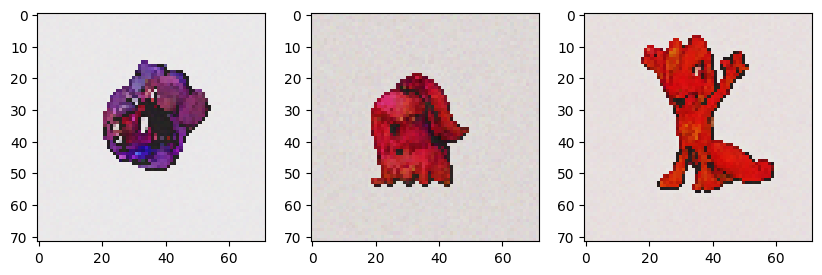

0.01570904:  70%|████████████████████████████████████████████████████████████████████████████████▉                                  | 175999/250001 [2:46:49<1:07:24, 18.30it/s]

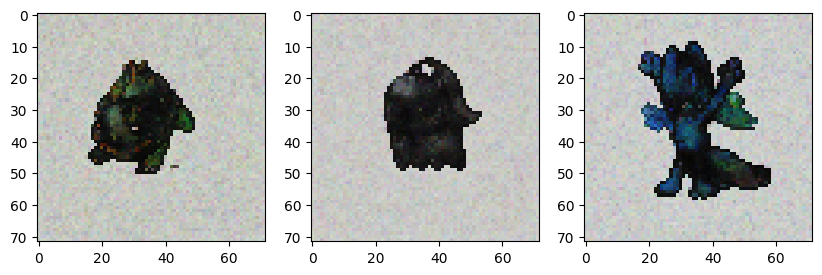

0.03111210:  71%|█████████████████████████████████████████████████████████████████████████████████▉                                 | 177999/250001 [2:48:43<1:05:33, 18.30it/s]

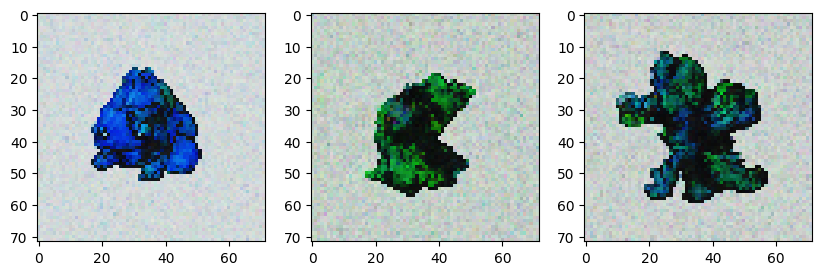

0.02574744:  72%|██████████████████████████████████████████████████████████████████████████████████▊                                | 179999/250001 [2:50:37<1:03:46, 18.29it/s]

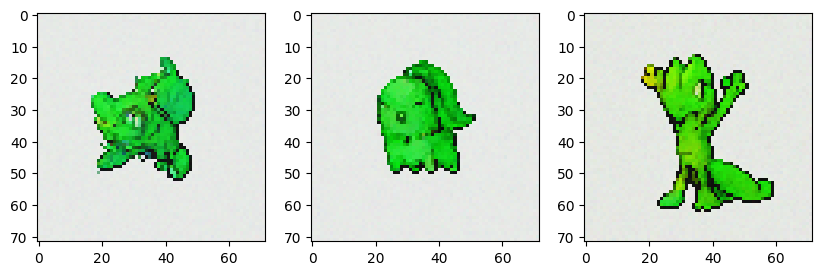

0.01809764:  73%|███████████████████████████████████████████████████████████████████████████████████▋                               | 181999/250001 [2:52:31<1:02:12, 18.22it/s]

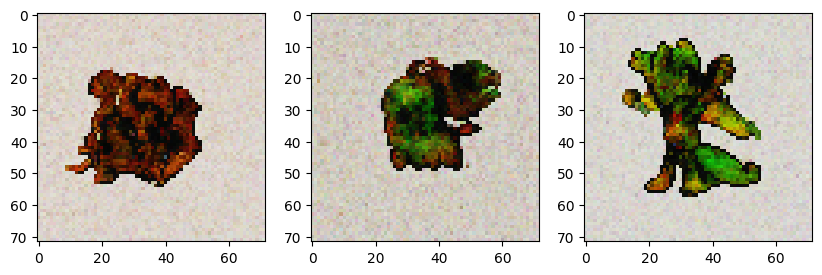

0.02108642:  74%|████████████████████████████████████████████████████████████████████████████████████▋                              | 183999/250001 [2:54:24<1:00:07, 18.29it/s]

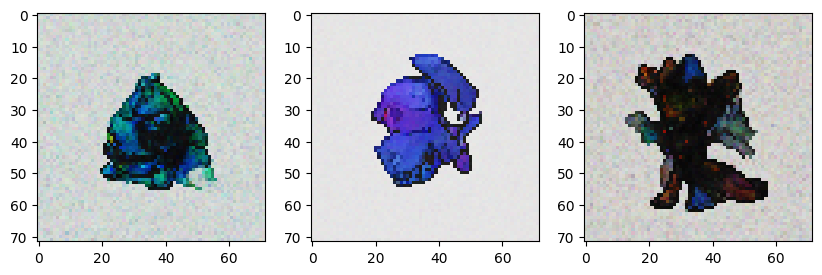

0.01514787:  74%|███████████████████████████████████████████████████████████████████████████████████████                              | 185999/250001 [2:56:18<58:11, 18.33it/s]

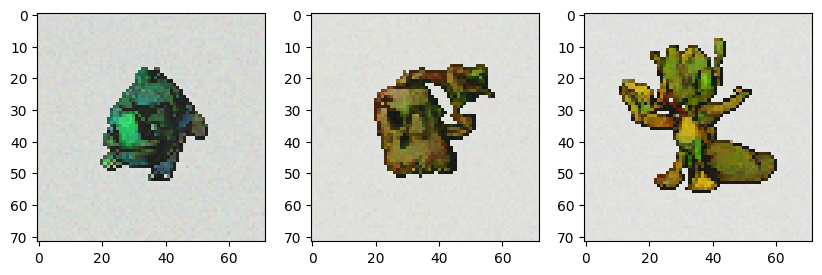

0.03660869:  75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 187999/250001 [2:58:12<56:30, 18.29it/s]

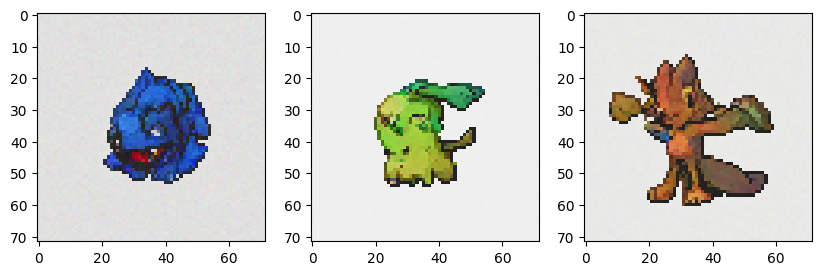

0.02704635:  76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 189999/250001 [3:00:05<54:34, 18.33it/s]

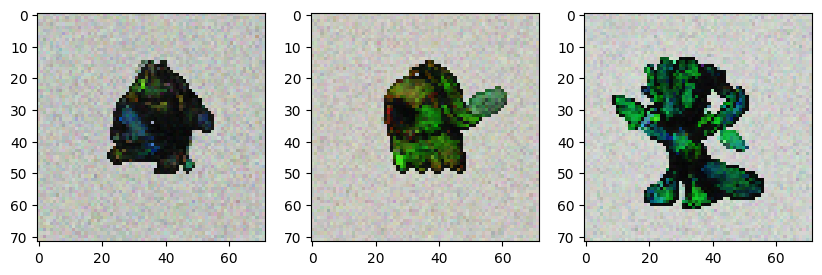

0.02136913:  77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 191999/250001 [3:01:59<52:52, 18.28it/s]

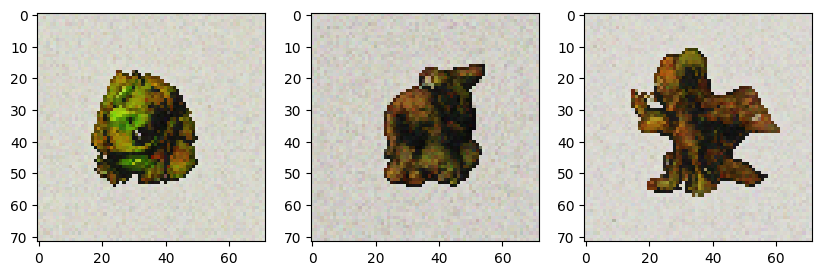

0.02018451:  78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 193999/250001 [3:03:53<51:03, 18.28it/s]

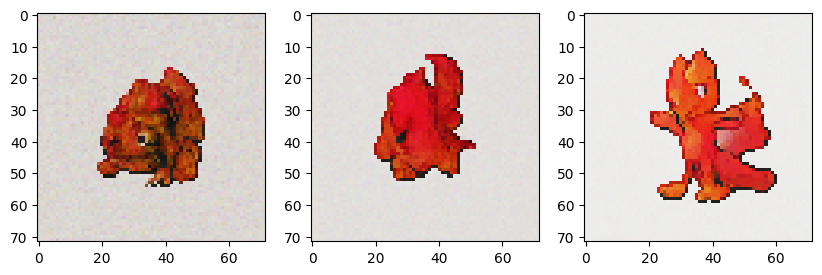

0.03828055:  78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 195999/250001 [3:05:47<49:07, 18.32it/s]

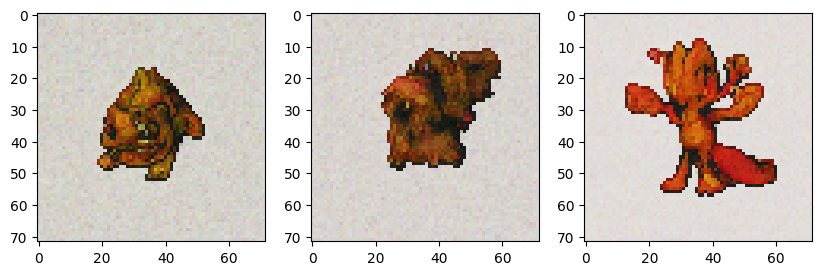

0.01200940:  79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 197999/250001 [3:07:40<47:23, 18.29it/s]

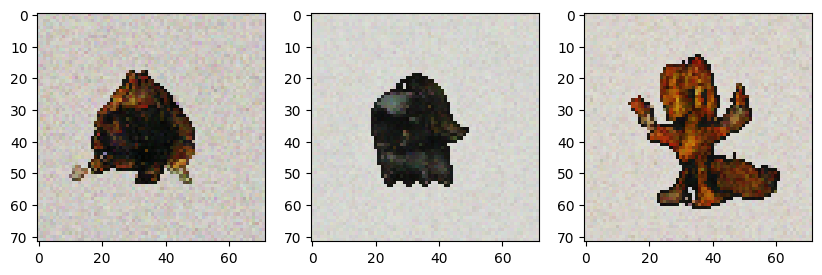

0.01777734:  80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 199999/250001 [3:09:34<45:29, 18.32it/s]

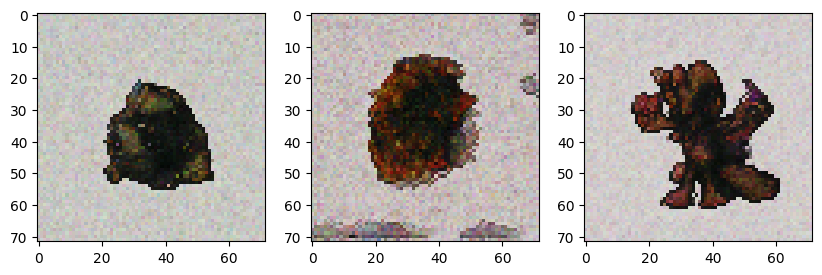

0.02035696:  81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 201999/250001 [3:11:28<43:44, 18.29it/s]

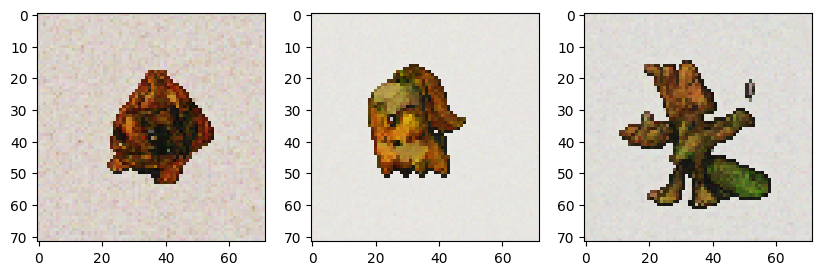

0.02957634:  82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 203999/250001 [3:13:21<41:55, 18.29it/s]

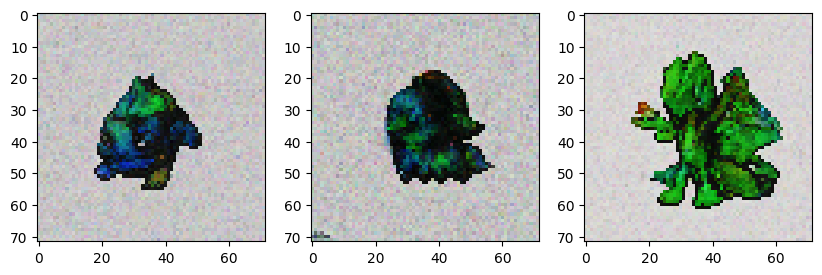

0.01479879:  82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 205999/250001 [3:15:15<40:00, 18.33it/s]

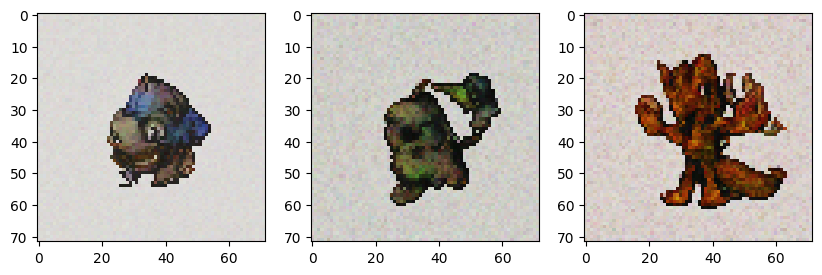

0.01105420:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 207999/250001 [3:17:09<38:10, 18.34it/s]

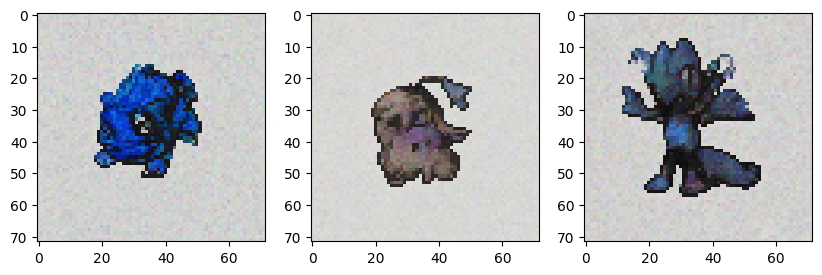

0.02756626:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 209999/250001 [3:19:03<36:26, 18.30it/s]

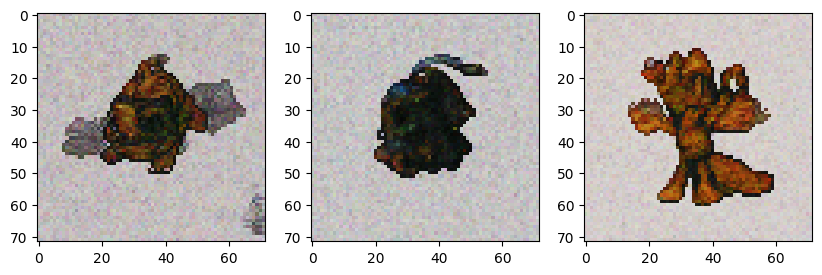

0.00906153:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 211999/250001 [3:20:56<34:36, 18.30it/s]

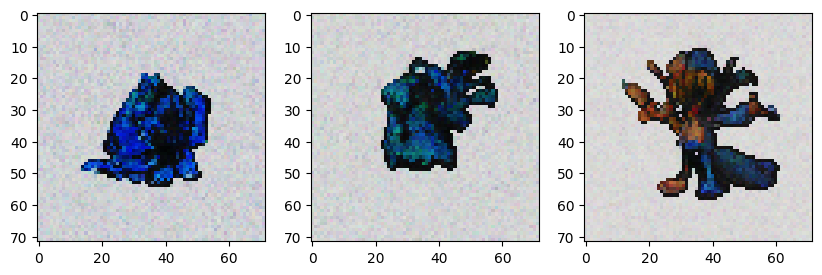

0.02613365:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 213999/250001 [3:22:50<32:48, 18.29it/s]

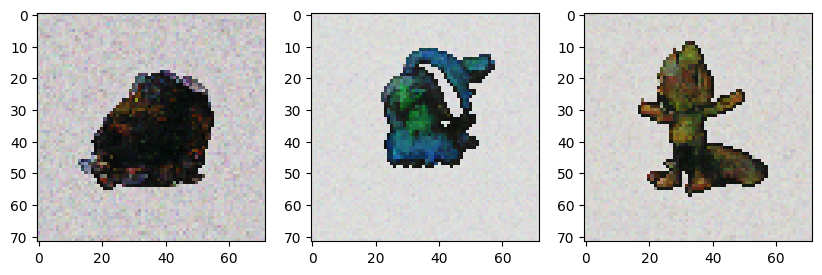

0.01902160:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 215999/250001 [3:24:44<30:59, 18.29it/s]

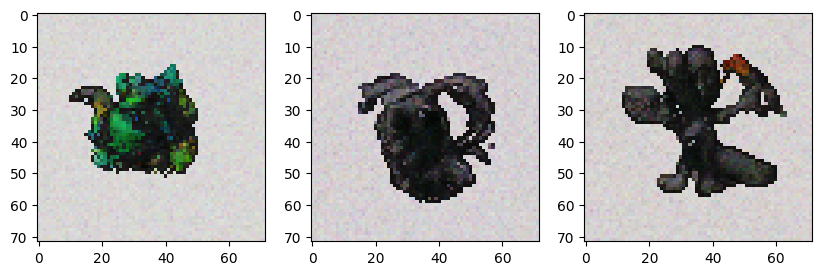

0.01949216:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 217999/250001 [3:26:37<29:05, 18.34it/s]

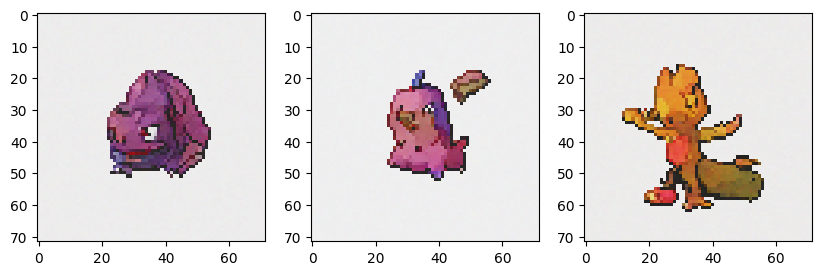

0.00652368:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 219999/250001 [3:28:31<27:19, 18.30it/s]

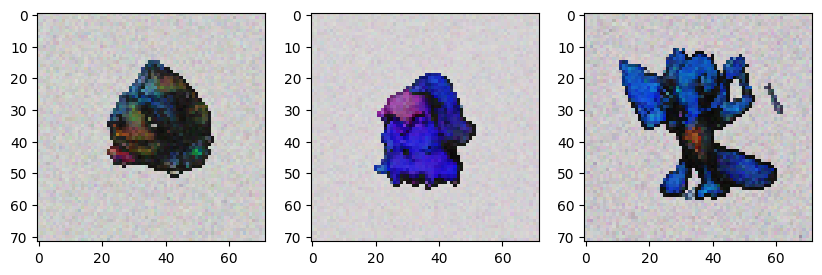

0.03086594:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 221999/250001 [3:30:25<25:29, 18.30it/s]

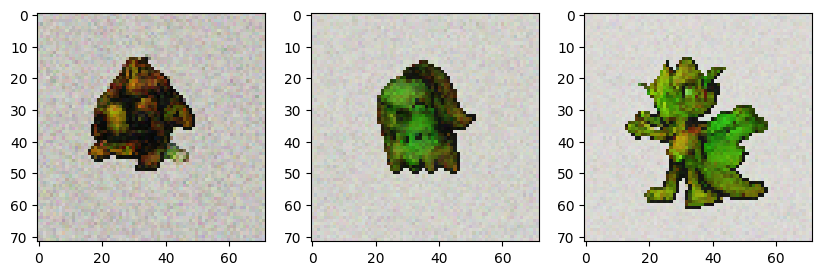

0.00836130:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 223999/250001 [3:32:19<23:41, 18.30it/s]

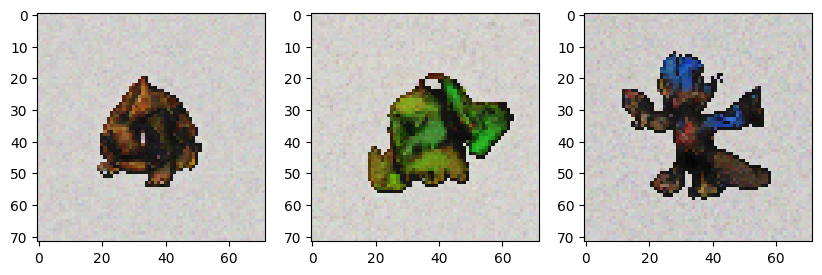

0.01698794:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 225999/250001 [3:34:12<21:50, 18.31it/s]

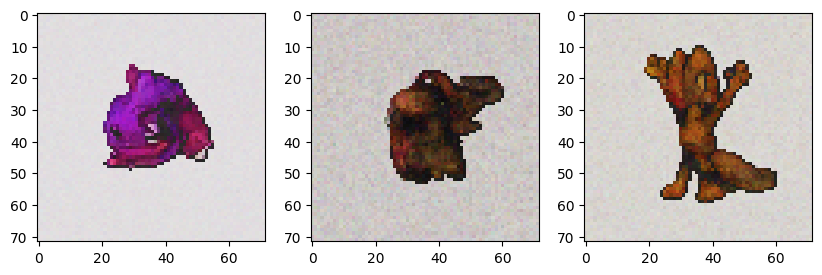

0.02274948:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 227999/250001 [3:36:06<19:59, 18.34it/s]

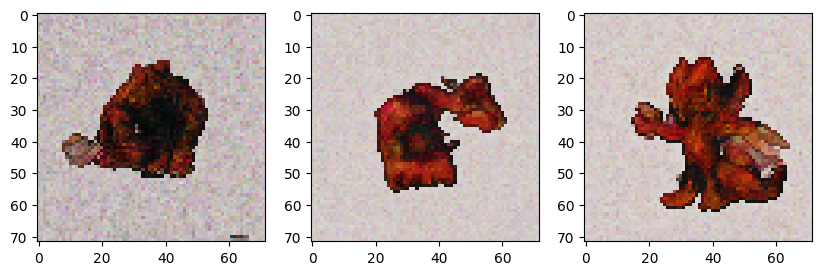

0.01050545:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 229999/250001 [3:38:00<18:11, 18.32it/s]

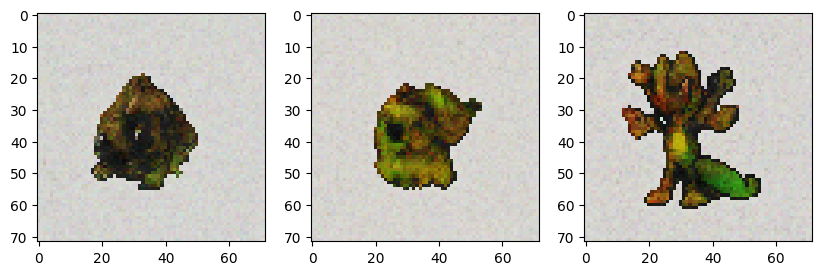

0.01933156:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 231999/250001 [3:39:53<16:24, 18.29it/s]

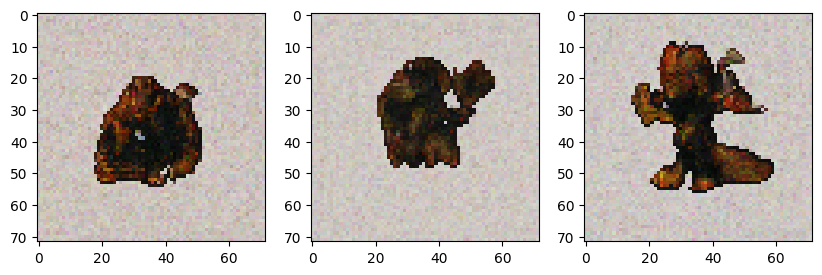

0.02370969:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 233999/250001 [3:41:47<14:33, 18.31it/s]

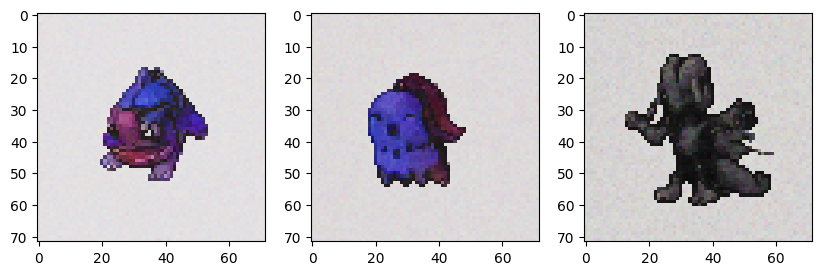

0.03166137:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 235999/250001 [3:43:41<12:44, 18.31it/s]

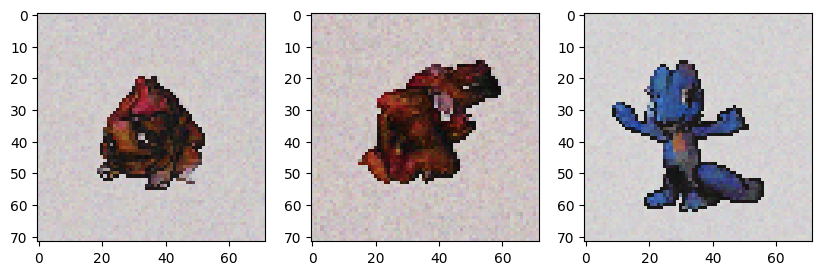

0.00720894:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 237999/250001 [3:45:35<10:56, 18.29it/s]

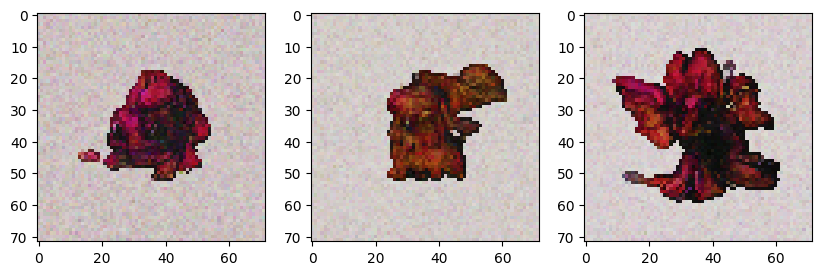

0.02257229:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 239999/250001 [3:47:28<09:07, 18.28it/s]

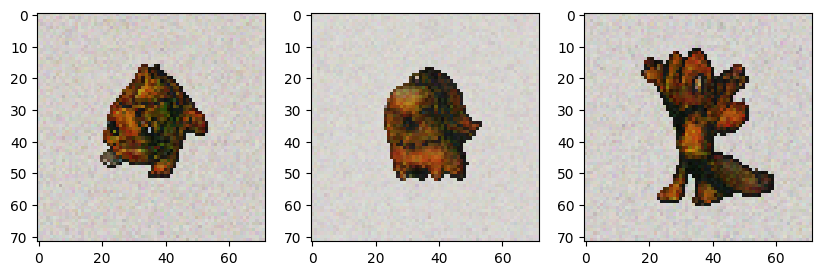

0.01749833:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 241999/250001 [3:49:22<07:16, 18.32it/s]

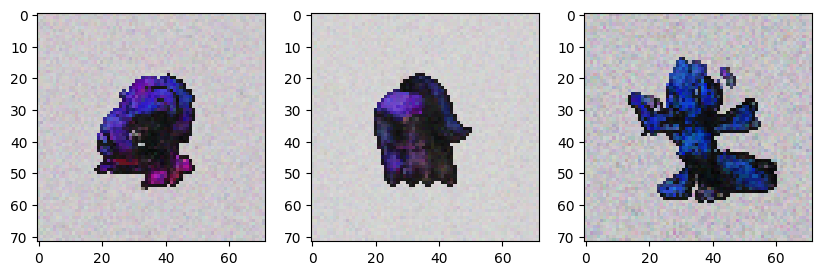

0.01748155:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 243999/250001 [3:51:16<05:27, 18.34it/s]

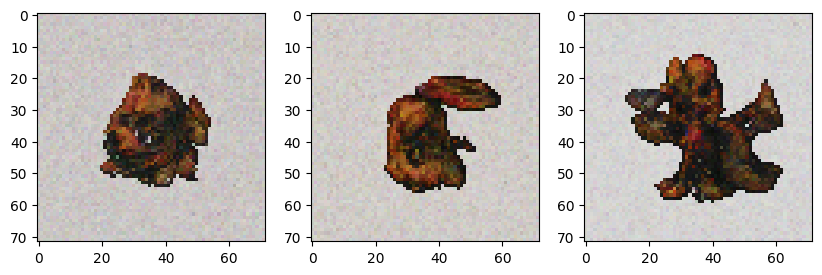

0.00901017:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 245999/250001 [3:53:09<03:38, 18.31it/s]

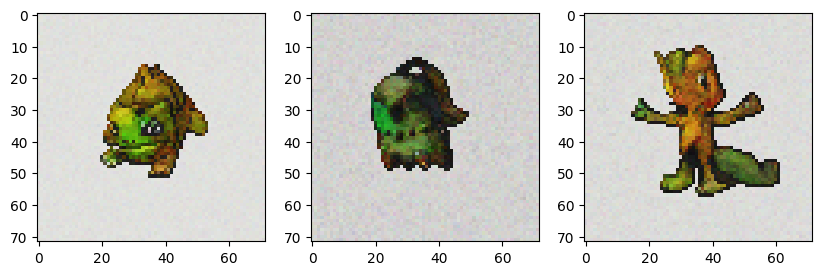

0.00904969:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 247999/250001 [3:55:03<01:49, 18.30it/s]

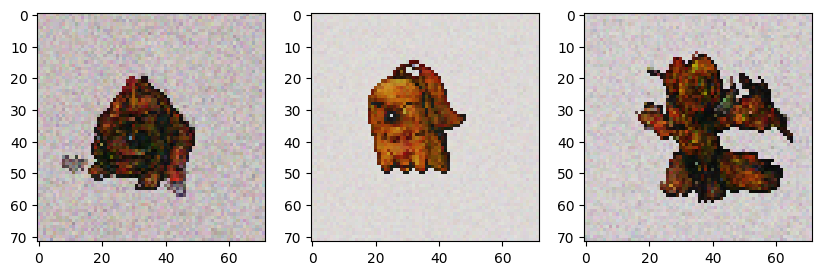

0.00273293: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 249999/250001 [3:56:57<00:00, 18.28it/s]

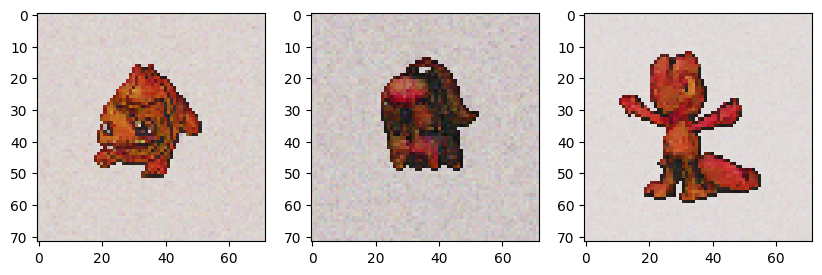

0.01860055: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250001/250001 [3:57:01<00:00, 17.58it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

pbar = tqdm(range(250001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    
    x0 = pimages[source, batch]
    c = contour[source, batch]
    
    xc = torch.cat([x0, c], dim=1)
    xc = torch.stack([pos_transform(x) for x in xc], dim=0)
    xc = isigmoid(xc)

    x0 = xc[:, :-1]
    c = xc[:, [-1]]

    x0 = torch.stack([col_transform(x) for x in x0], dim=0)

    ty = types[batch]

    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty, c)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 2000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')